### LIBRARIES

In [ ]:
#!pip install plotly

In [ ]:

from datetime import datetime
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import silhouette_score
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, IsolationForest
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from statsmodels.graphics.tsaplots import plot_acf
from scipy.optimize import minimize
import matplotlib.pyplot as plt

import plotly.graph_objects as go


### Import Merged Dataset

In [ ]:
df_wind = pd.read_csv('https://drive.google.com/uc?id=14ZYNIfXQZeFUokhK2-svybYqeNN0mvU4')

In [ ]:

df_wind['TimeStamp'] = pd.to_datetime(df_wind['TimeStamp'], format='mixed', dayfirst=True, errors='coerce')


### EDA
Structure:
1. Checking types, duplicates, null values
2. Resampling df_Wind to Monthly, Weekly and Daily Observations
3. Plotting distribution and time series for each variable
4. Autocorrelation
5. Decomposition
6. Active Power vs other variables
7. Correlation Matrix
8. Outlier Detection

#### Checking Types, Duplicates, Null values

In [ ]:
df_wind.head()

,TimeStamp,WindSpeed_Mean,VoltL1_Mean,VoltL2_Mean,VoltL3_Mean,ActivePower_Mean,CurrentL1_Mean,CurrentL2_Mean,CurrentL3_Mean,PowerFactor_Mean,Frequency_Mean
0,2016-01-01 00:00:00,6.785655,392.817993,393.226410,392.404510,521.591797,588.076599,588.153687,588.288208,0.735540,50.030361
1,2016-01-01 00:10:00,6.085925,392.750610,393.095093,392.344208,352.522308,491.073486,491.226807,491.788910,0.564326,49.993130
2,2016-01-01 00:20:00,5.824687,393.093109,393.321503,392.433807,294.078888,472.158508,472.661804,472.771088,0.512421,49.952190
3,2016-01-01 00:30:00,7.100197,393.863586,394.046600,393.028595,587.302795,674.494019,674.627991,674.614319,0.705167,49.975941
4,2016-01-01 00:40:00,8.232280,394.487793,394.654785,393.713715,881.533325,866.352600,866.474121,865.911682,0.840677,49.930500


In [ ]:
df_wind.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 407155 entries, 0 to 407154
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   TimeStamp         407155 non-null  datetime64[ns]
 1   WindSpeed_Mean    407140 non-null  float64       
 2   VoltL1_Mean       407140 non-null  float64       
 3   VoltL2_Mean       407140 non-null  float64       
 4   VoltL3_Mean       407140 non-null  float64       
 5   ActivePower_Mean  407140 non-null  float64       
 6   CurrentL1_Mean    407140 non-null  float64       
 7   CurrentL2_Mean    407140 non-null  float64       
 8   CurrentL3_Mean    407140 non-null  float64       
 9   PowerFactor_Mean  407140 non-null  float64       
 10  Frequency_Mean    407140 non-null  float64       
dtypes: datetime64[ns](1), float64(10)
memory usage: 34.2 MB


In [ ]:
df_wind.describe()

,TimeStamp,WindSpeed_Mean,VoltL1_Mean,VoltL2_Mean,VoltL3_Mean,ActivePower_Mean,CurrentL1_Mean,CurrentL2_Mean,CurrentL3_Mean,PowerFactor_Mean,Frequency_Mean
count,407155,407140.000000,407140.000000,407140.000000,407140.000000,407140.000000,407140.000000,407140.000000,407140.000000,407140.000000,407140.000000
mean,2019-12-07 10:53:16.478982144,6.409428,398.813599,398.675534,397.326866,612.414336,556.623569,557.575404,557.298149,0.576639,49.955275
min,2016-01-01 00:00:00,0.000000,0.079635,0.083213,0.084718,-23.093781,0.277433,0.077600,0.611983,-0.940154,0.000000
25%,2017-12-20 00:25:00,4.057754,395.827065,395.528992,395.002266,51.694701,93.402231,94.102993,95.108986,0.294627,49.955879
50%,2019-12-01 19:10:00,6.295893,399.509003,398.882507,397.865997,302.389206,338.614655,339.539597,340.118805,0.871002,49.993309
75%,2021-11-09 22:45:00,8.870478,401.861626,401.981903,400.215912,986.778183,863.201386,864.258698,863.494080,0.976152,50.033371
max,2024-01-01 00:00:00,29.126440,414.694794,413.938995,411.535309,2304.946045,1986.098999,1987.605957,1986.524048,1.000000,50.198299
std,NaN,4.107161,11.566650,11.613063,11.445145,708.378005,580.544269,580.841152,579.875710,0.536472,1.357714


In [ ]:
df_wind.dtypes

,0
TimeStamp,datetime64[ns]
WindSpeed_Mean,float64
VoltL1_Mean,float64
VoltL2_Mean,float64
VoltL3_Mean,float64
ActivePower_Mean,float64
CurrentL1_Mean,float64
CurrentL2_Mean,float64
CurrentL3_Mean,float64
PowerFactor_Mean,float64


In [ ]:
nulls = df_wind.isnull().sum()

for col in nulls.index:
    if nulls[col] > 0:
        print(f"\nColumn: {col} has {nulls[col]} missing values")
        print(df_wind[df_wind[col].isnull()][['TimeStamp', col]])



Column: WindSpeed_Mean has 15 missing values
                 TimeStamp  WindSpeed_Mean
29200  2016-07-22 11:40:00             NaN
29201  2016-07-22 11:50:00             NaN
302841 2021-10-23 09:20:00             NaN
325968 2022-04-05 08:20:00             NaN
332332 2022-05-19 13:40:00             NaN
336917 2022-06-20 11:00:00             NaN
337049 2022-06-21 13:20:00             NaN
337051 2022-06-21 14:00:00             NaN
339896 2022-07-11 08:40:00             NaN
342924 2022-08-01 12:50:00             NaN
344175 2022-08-10 08:50:00             NaN
345749 2022-08-21 12:00:00             NaN
348879 2022-09-12 06:00:00             NaN
354300 2022-10-31 12:40:00             NaN
363349 2023-03-02 10:20:00             NaN

Column: VoltL1_Mean has 15 missing values
                 TimeStamp  VoltL1_Mean
29200  2016-07-22 11:40:00          NaN
29201  2016-07-22 11:50:00          NaN
302841 2021-10-23 09:20:00          NaN
325968 2022-04-05 08:20:00          NaN
332332 2022-05-19 13:40

In [ ]:
df_wind.duplicated().sum()

np.int64(0)

In [ ]:
duplicate = df_wind[df_wind.duplicated()]

print("Duplicate Rows :")

duplicate


Duplicate Rows :


,TimeStamp,WindSpeed_Mean,VoltL1_Mean,VoltL2_Mean,VoltL3_Mean,ActivePower_Mean,CurrentL1_Mean,CurrentL2_Mean,CurrentL3_Mean,PowerFactor_Mean,Frequency_Mean


In [ ]:
#Drop NaNs
df_wind = df_wind.dropna()
df_wind.info()

<class 'pandas.core.frame.DataFrame'>
Index: 407140 entries, 0 to 407154
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   TimeStamp         407140 non-null  datetime64[ns]
 1   WindSpeed_Mean    407140 non-null  float64       
 2   VoltL1_Mean       407140 non-null  float64       
 3   VoltL2_Mean       407140 non-null  float64       
 4   VoltL3_Mean       407140 non-null  float64       
 5   ActivePower_Mean  407140 non-null  float64       
 6   CurrentL1_Mean    407140 non-null  float64       
 7   CurrentL2_Mean    407140 non-null  float64       
 8   CurrentL3_Mean    407140 non-null  float64       
 9   PowerFactor_Mean  407140 non-null  float64       
 10  Frequency_Mean    407140 non-null  float64       
dtypes: datetime64[ns](1), float64(10)
memory usage: 37.3 MB


#### Resampling df_Wind to Monthly, Weekly and Daily Observations

In [ ]:
#Set TimeStamp as Index
if df_wind.index.name != 'TimeStamp': # only set the index if it's not already named 'TimeStamp'
    if 'TimeStamp' in df_wind.columns:
        df_wind = df_wind.set_index('TimeStamp')
    else:
        raise KeyError("Column 'TimeStamp' already set as index")

#resample to monthly obersvations
df_monthly = df_wind.resample('ME').mean()

#resample to yearly observations
df_yearly = df_wind.resample('YE').mean()


#### Plotting distribution and time series for each variable

##### Current Electricity (A)

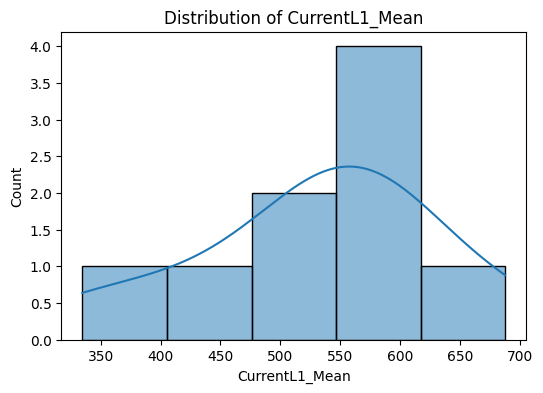

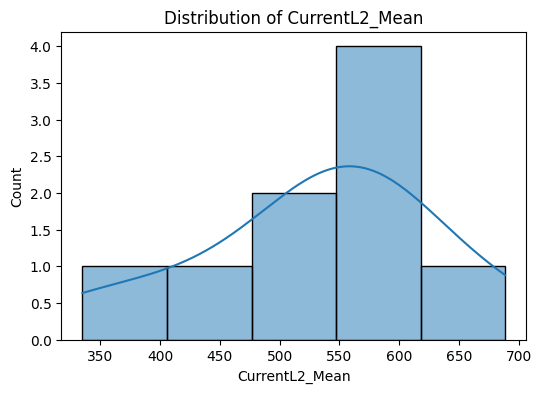

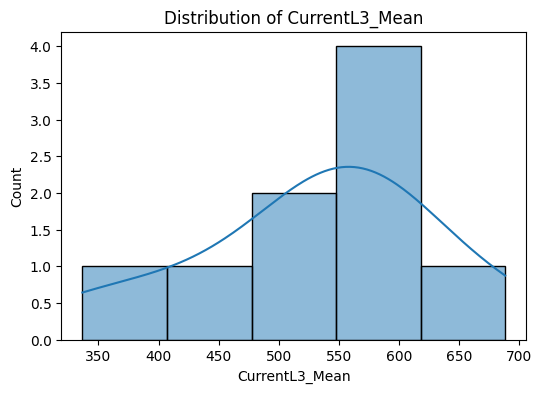

In [ ]:
# plot distribution of variables
# daily data
current_col = ['CurrentL1_Mean', 'CurrentL2_Mean','CurrentL3_Mean']

for col in current_col:
    plt.figure(figsize=(6, 4))
    sns.histplot(df_yearly[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)

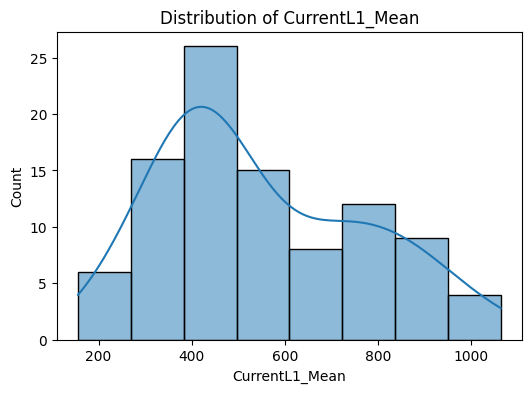

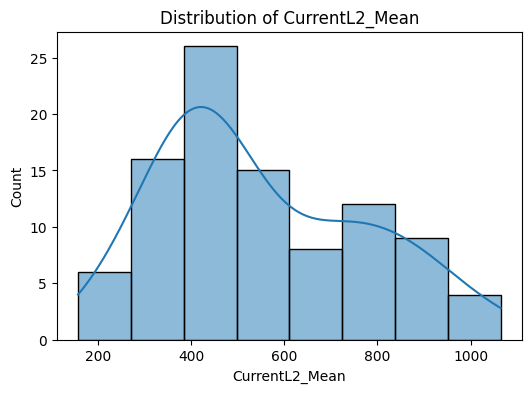

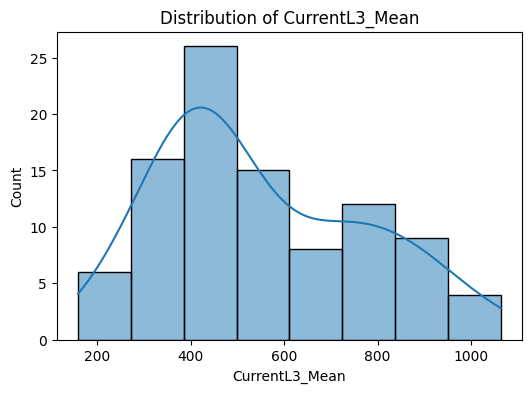

In [ ]:
#monthly data
current_col = ['CurrentL1_Mean', 'CurrentL2_Mean','CurrentL3_Mean']

for col in current_col:
    plt.figure(figsize=(6, 4))
    sns.histplot(df_monthly[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)

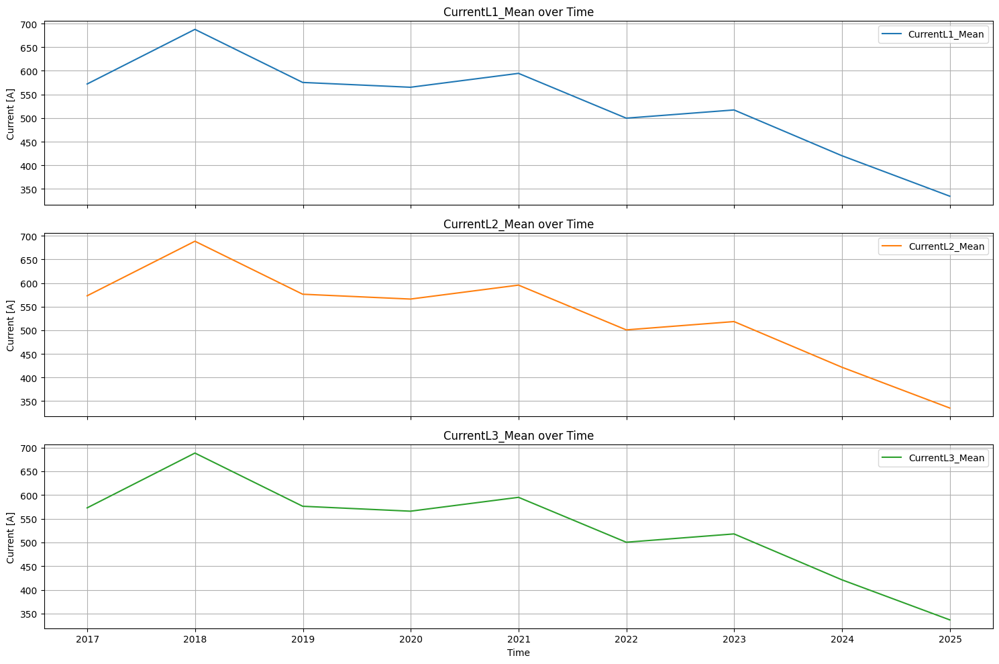

In [ ]:
# Time Series with yearly observations
current_col = ['CurrentL1_Mean', 'CurrentL2_Mean','CurrentL3_Mean']

# Plot
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(15, 10), sharex=True)

for i, col in enumerate(current_col):
    axes[i].plot(df_yearly.index, df_yearly[col], label=col, color='C' + str(i))
    axes[i].set_ylabel('Current [A]')
    axes[i].set_title(f'{col} over Time')
    axes[i].grid(True)
    axes[i].legend(loc='upper right')

axes[-1].set_xlabel('Time')
plt.tight_layout()
plt.show()

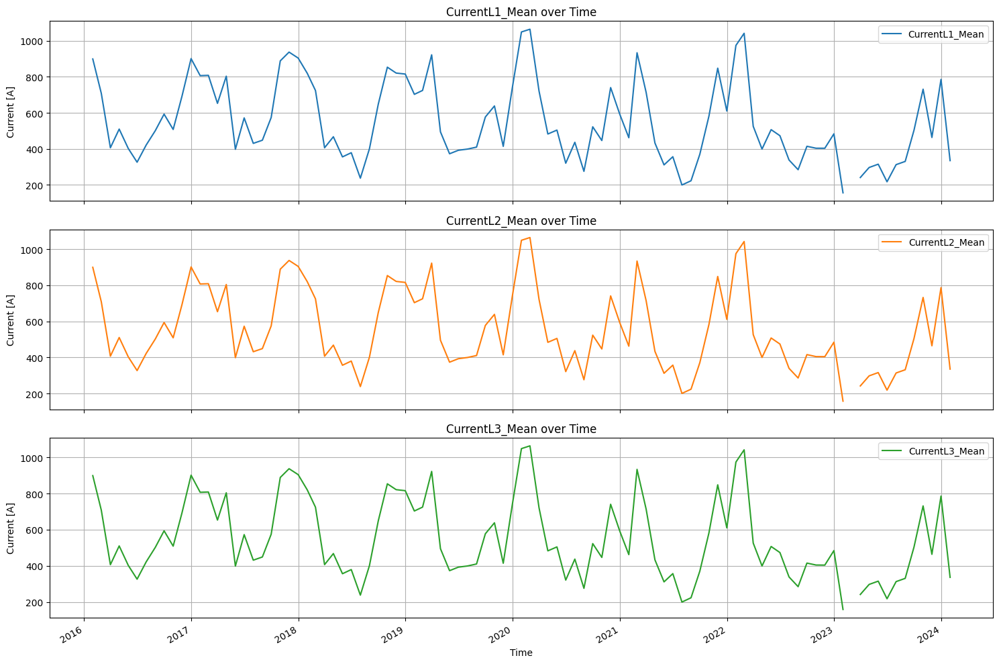

In [ ]:
# Time Series with monthly observations
current_col = ['CurrentL1_Mean', 'CurrentL2_Mean','CurrentL3_Mean']

# Plot
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(15, 10), sharex=True)

for i, col in enumerate(current_col):
    axes[i].plot(df_monthly.index, df_monthly[col], label=col, color=f'C{i}')
    axes[i].set_ylabel('Current [A]')
    axes[i].set_title(f'{col} over Time')
    axes[i].grid(True)
    axes[i].legend(loc='upper right')

# Set shared x-axis label and format
axes[-1].set_xlabel('Time')

# Optional: format x-axis ticks for better readability (especially for datetime)
fig.autofmt_xdate()

plt.tight_layout()
plt.show()

##### Voltage (V)

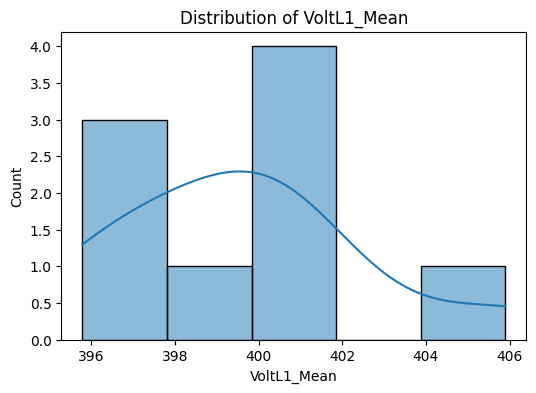

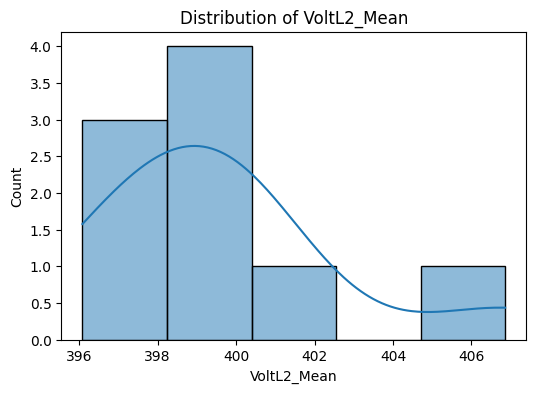

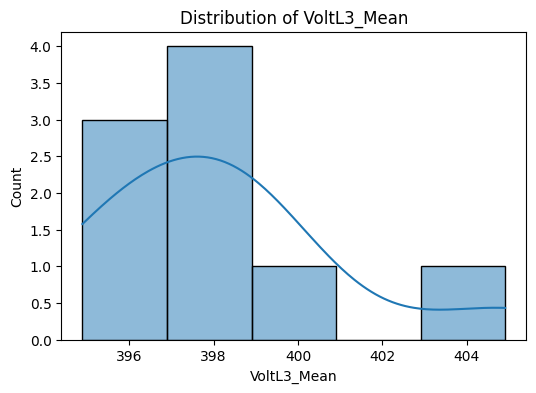

In [ ]:
# plot distribution of variables
# daily data
current_col = ['VoltL1_Mean','VoltL2_Mean','VoltL3_Mean']

for col in current_col:
    plt.figure(figsize=(6, 4))
    sns.histplot(df_yearly[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)

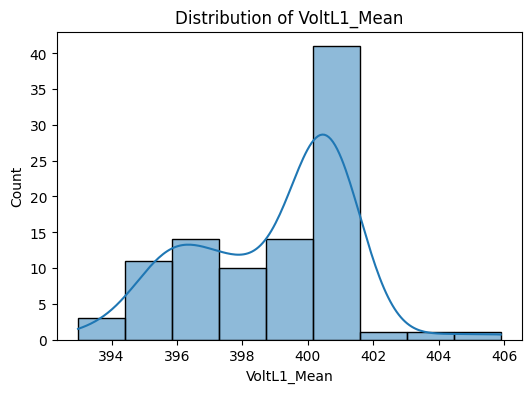

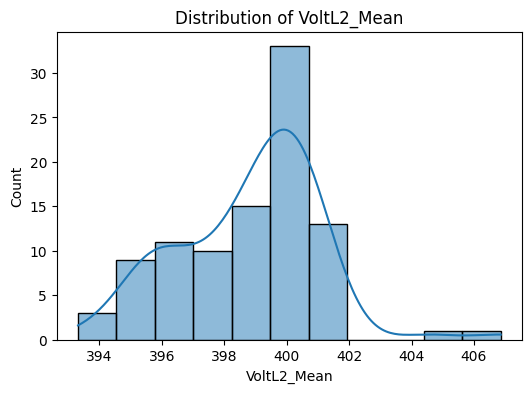

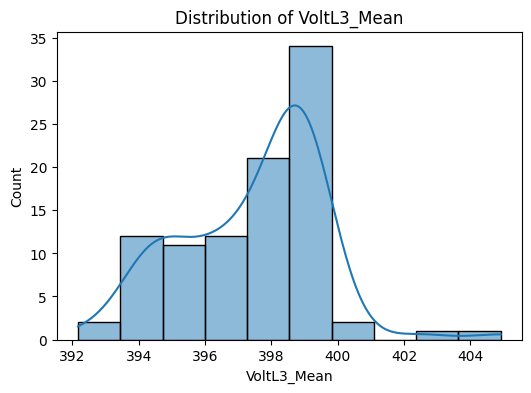

In [ ]:
# plot distribution of variables
# monthly data
current_col = ['VoltL1_Mean','VoltL2_Mean','VoltL3_Mean']

for col in current_col:
    plt.figure(figsize=(6, 4))
    sns.histplot(df_monthly[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)

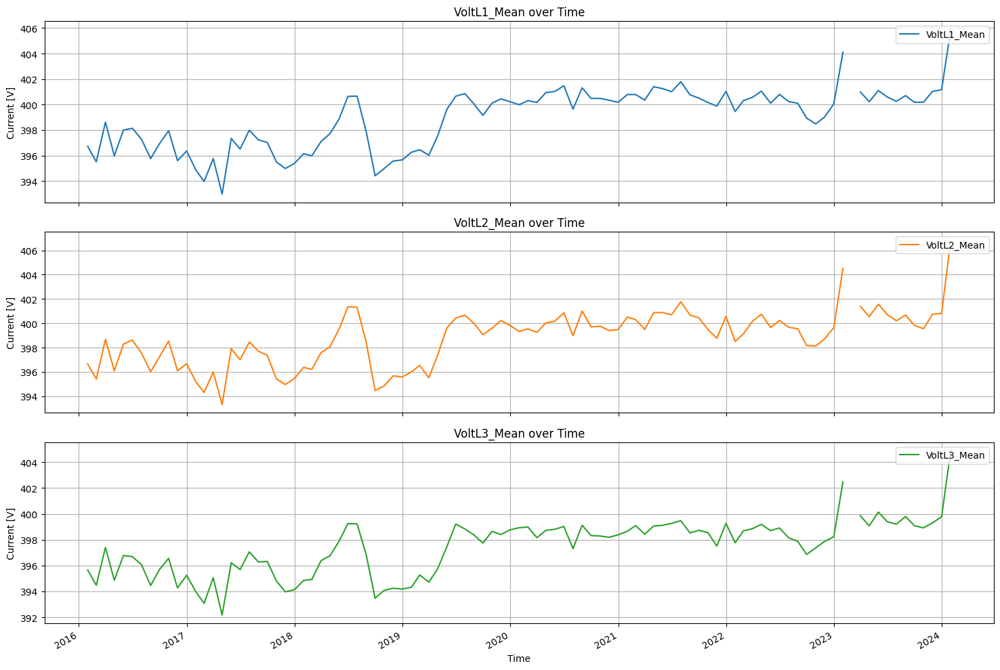

In [ ]:
# Time Series with monthly observations
current_col = ['VoltL1_Mean', 'VoltL2_Mean','VoltL3_Mean']

# Plot
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(15, 10), sharex=True)

for i, col in enumerate(current_col):
    axes[i].plot(df_monthly.index, df_monthly[col], label=col, color=f'C{i}')
    axes[i].set_ylabel('Current [V]')
    axes[i].set_title(f'{col} over Time')
    axes[i].grid(True)
    axes[i].legend(loc='upper right')

# Set shared x-axis label and format
axes[-1].set_xlabel('Time')

# Optional: format x-axis ticks for better readability (especially for datetime)
fig.autofmt_xdate()

plt.tight_layout()
plt.show()

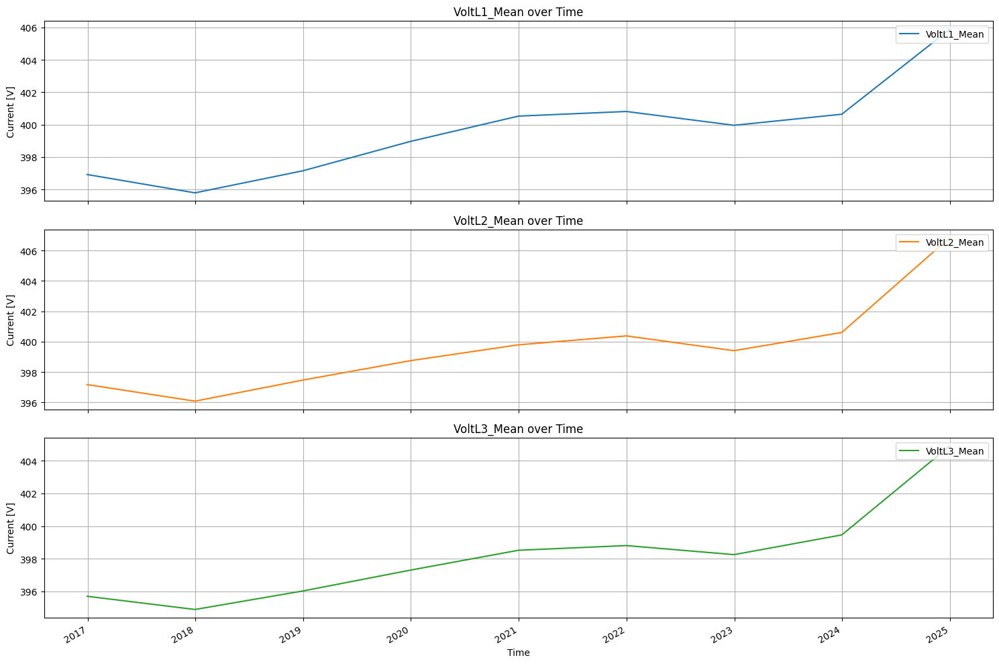

In [ ]:
# time series yearly
current_col = ['VoltL1_Mean', 'VoltL2_Mean','VoltL3_Mean']

# Plot
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(15, 10), sharex=True)

for i, col in enumerate(current_col):
    axes[i].plot(df_yearly.index, df_yearly[col], label=col, color=f'C{i}')
    axes[i].set_ylabel('Current [V]')
    axes[i].set_title(f'{col} over Time')
    axes[i].grid(True)
    axes[i].legend(loc='upper right')

# Set shared x-axis label and format
axes[-1].set_xlabel('Time')

# Optional: format x-axis ticks for better readability (especially for datetime)
fig.autofmt_xdate()

plt.tight_layout()
plt.show()

##### Frequency (Hz)

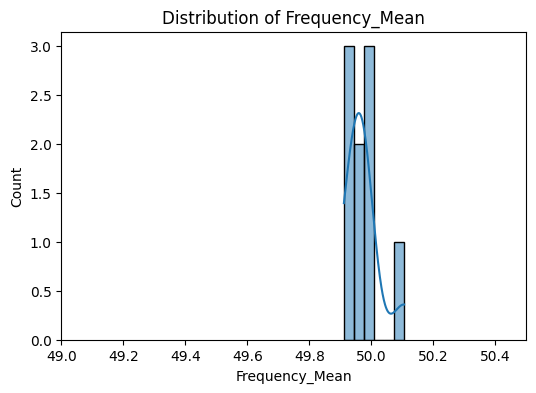

In [ ]:
# plot distribution of variables
# yearly data
selected_col = ['Frequency_Mean']

for col in selected_col:
    plt.figure(figsize=(6, 4))
    sns.histplot(df_yearly[col], kde=True)
    plt.xlim(49,50.5)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)



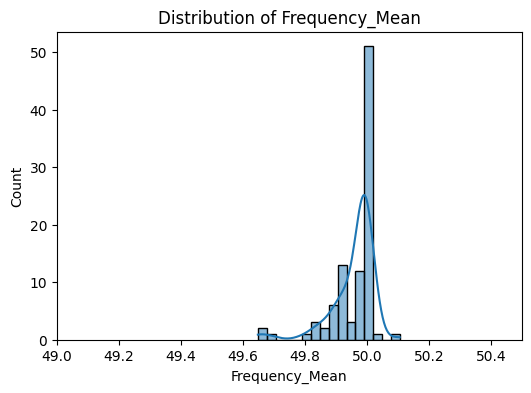

In [ ]:
# plot distribution of variables
# monthly data
selected_col = ['Frequency_Mean']

for col in selected_col:
    plt.figure(figsize=(6, 4))
    sns.histplot(df_monthly[col], kde=True)
    plt.xlim(49,50.5)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)


#we should consider setting a 'normal' area -> what is out of normal/unrealstic values?

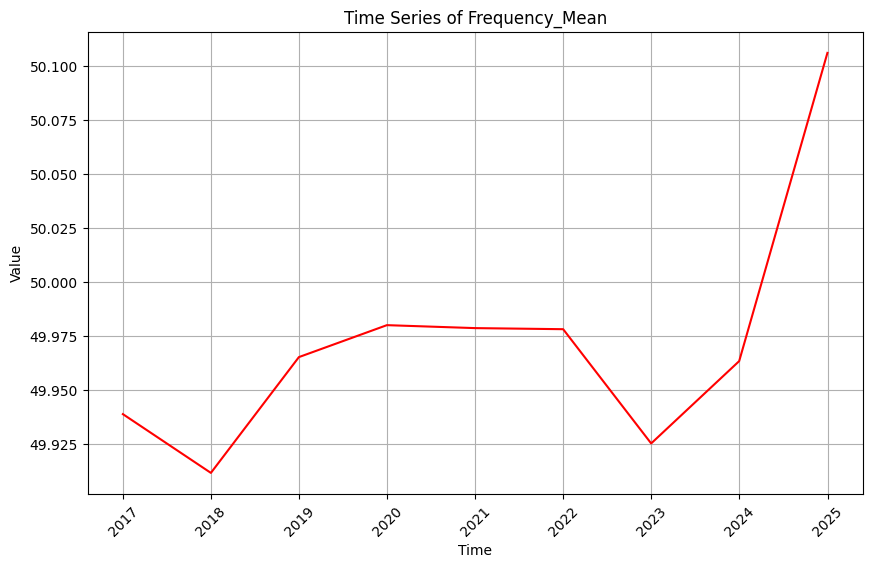

In [ ]:
# Time Series Frequency with yearly observations
#df.set_index('TimeStamp', inplace=True)
plt.figure(figsize=(10, 6))
plt.plot(df_yearly.index, df_yearly['Frequency_Mean'], linestyle='-', color='r')
plt.title('Time Series of Frequency_Mean')
plt.xlabel('Time')
plt.ylabel('Value')
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.grid(True)
plt.show()


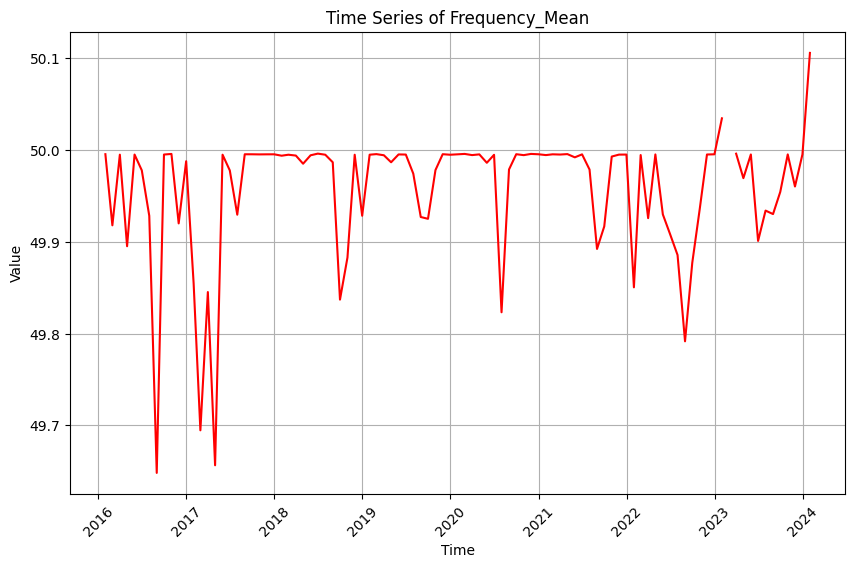

In [ ]:
# time series with Frequency monthly
#df.set_index('TimeStamp', inplace=True)
plt.figure(figsize=(10, 6))
plt.plot(df_monthly.index, df_monthly['Frequency_Mean'], linestyle='-', color='r')
plt.title('Time Series of Frequency_Mean')
plt.xlabel('Time')
plt.ylabel('Value')
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.grid(True)
plt.show()


##### Power Factor

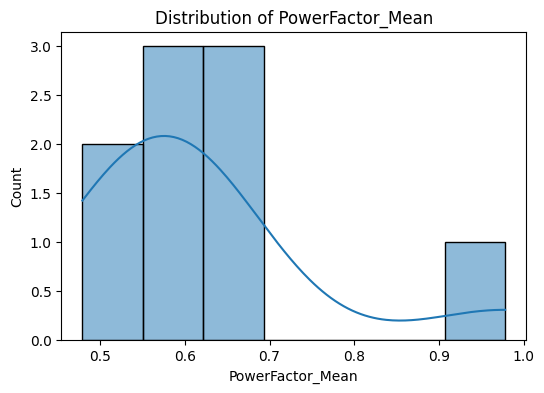

In [ ]:
# plot distribution of variable
# yearly data
selected_col = ['PowerFactor_Mean']

for col in selected_col:
    plt.figure(figsize=(6, 4))
    sns.histplot(df_yearly[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)


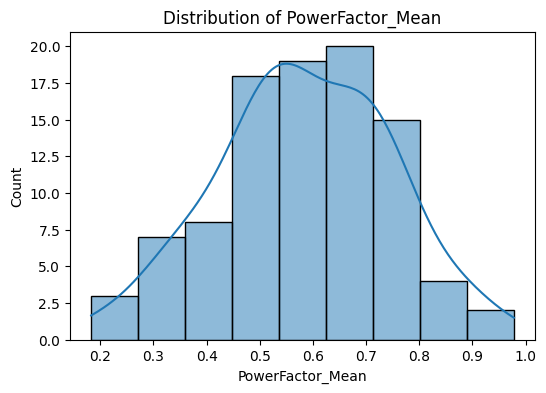

In [ ]:
# plot distribution of variables
# monthly data
selected_col = ['PowerFactor_Mean']

for col in selected_col:
    plt.figure(figsize=(6, 4))
    sns.histplot(df_monthly[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)



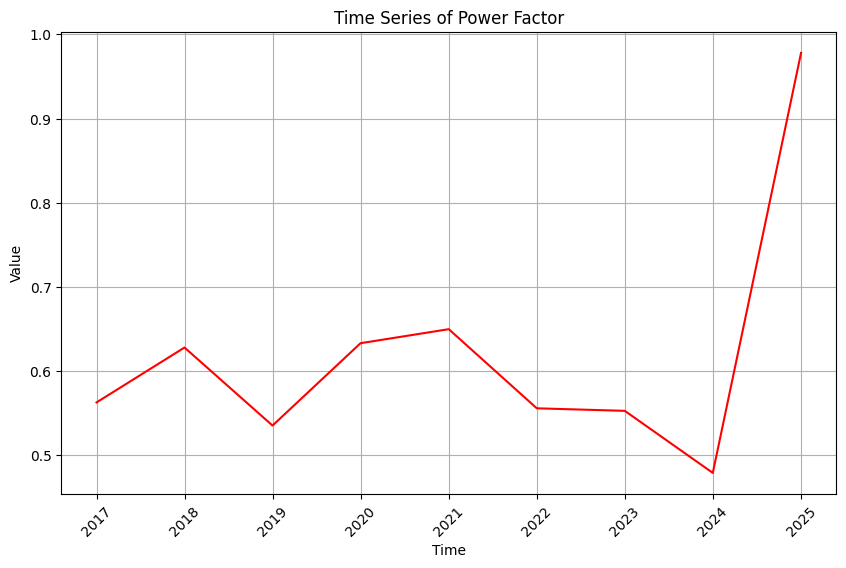

In [ ]:
# time series yearly
#df.set_index('TimeStamp', inplace=True)
plt.figure(figsize=(10, 6))
plt.plot(df_yearly.index, df_yearly['PowerFactor_Mean'], linestyle='-', color='r')
plt.title('Time Series of Power Factor')
plt.xlabel('Time')
plt.ylabel('Value')
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.grid(True)
plt.show()


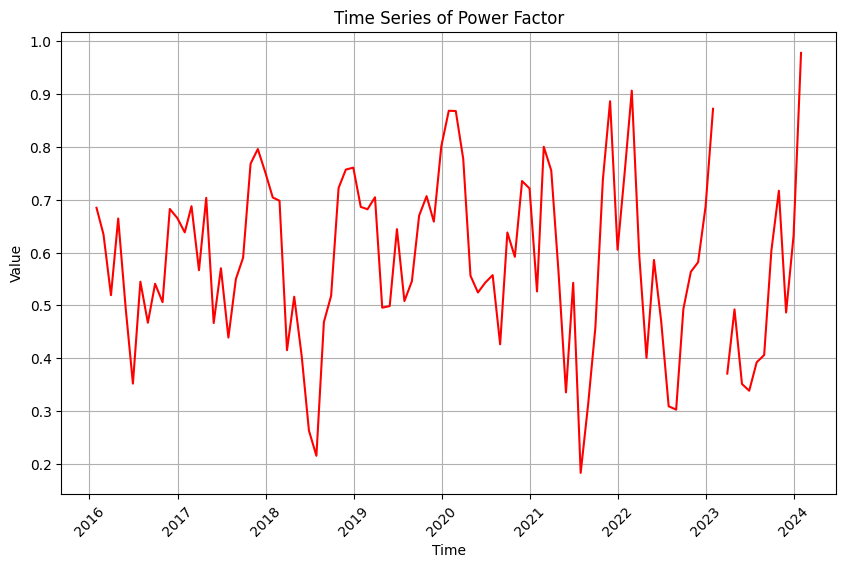

In [ ]:
# time series monthly
#df.set_index('TimeStamp', inplace=True)
plt.figure(figsize=(10, 6))
plt.plot(df_monthly.index, df_monthly['PowerFactor_Mean'], linestyle='-', color='r')
plt.title('Time Series of Power Factor')
plt.xlabel('Time')
plt.ylabel('Value')
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.grid(True)
plt.show()


##### Wind Speed

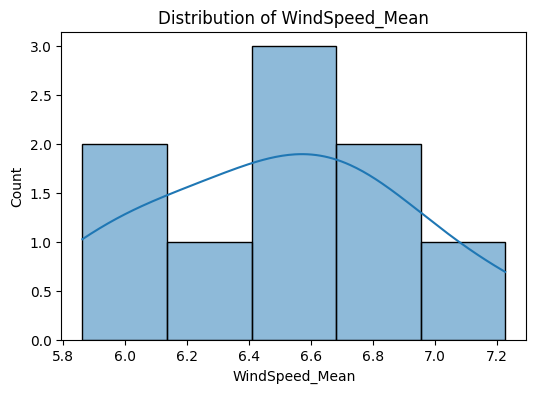

In [ ]:
# plot distribution of variables daily
selected_col = ['WindSpeed_Mean']

for col in selected_col:
    plt.figure(figsize=(6, 4))
    sns.histplot(df_yearly[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)


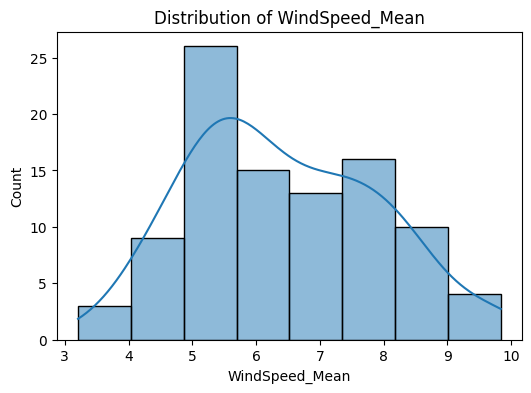

In [ ]:
# plot distribution of variables monthly
selected_col = ['WindSpeed_Mean']

for col in selected_col:
    plt.figure(figsize=(6, 4))
    sns.histplot(df_monthly[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)



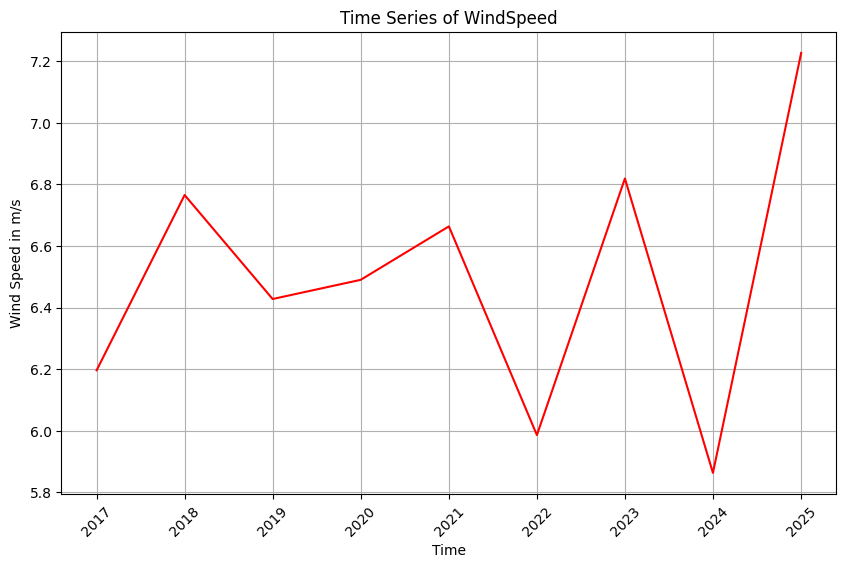

In [ ]:
# time series with Wind Speed yearly
#df.set_index('TimeStamp', inplace=True)
plt.figure(figsize=(10, 6))
plt.plot(df_yearly.index, df_yearly['WindSpeed_Mean'], linestyle='-', color='r')
plt.title('Time Series of WindSpeed')
plt.xlabel('Time')
plt.ylabel('Wind Speed in m/s')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

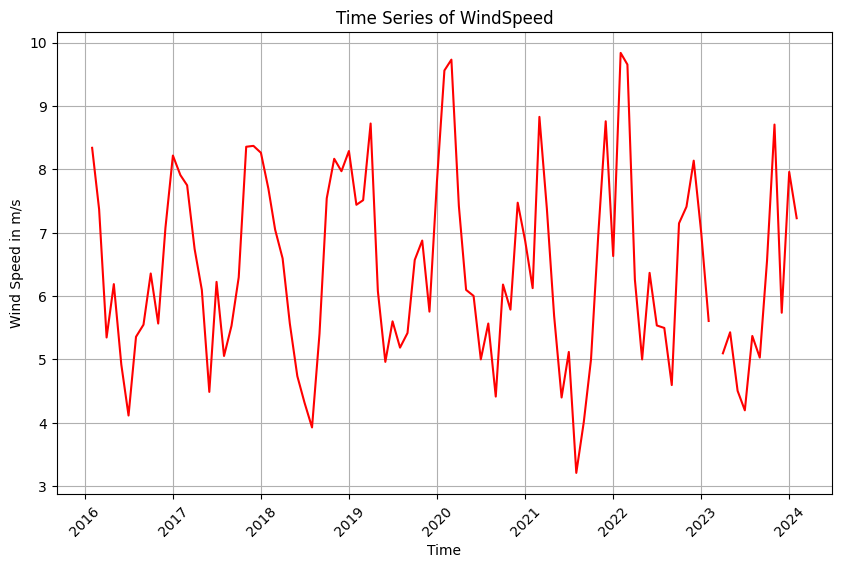

In [ ]:
# time series with Wind Speed monthly
#df.set_index('TimeStamp', inplace=True)
plt.figure(figsize=(10, 6))
plt.plot(df_monthly.index, df_monthly['WindSpeed_Mean'], linestyle='-', color='r')
plt.title('Time Series of WindSpeed')
plt.xlabel('Time')
plt.ylabel('Wind Speed in m/s')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

##### ActivePower

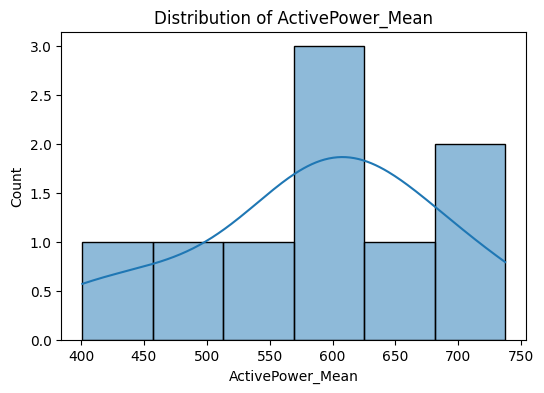

In [ ]:
# plot distribution of variable
# daily data
selected_col = ['ActivePower_Mean']

for col in selected_col:
    plt.figure(figsize=(6, 4))
    sns.histplot(df_yearly[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)



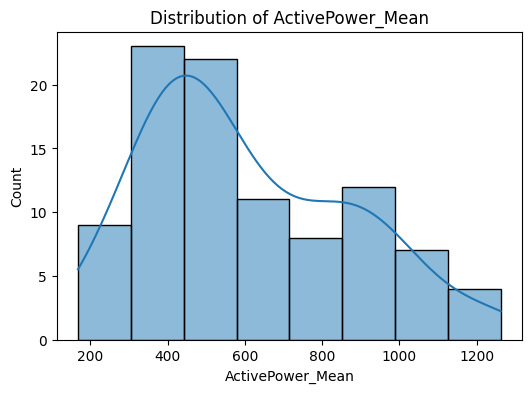

In [ ]:
# plot distribution of variable
# monthly
selected_col = ['ActivePower_Mean']

for col in selected_col:
    plt.figure(figsize=(6, 4))
    sns.histplot(df_monthly[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)



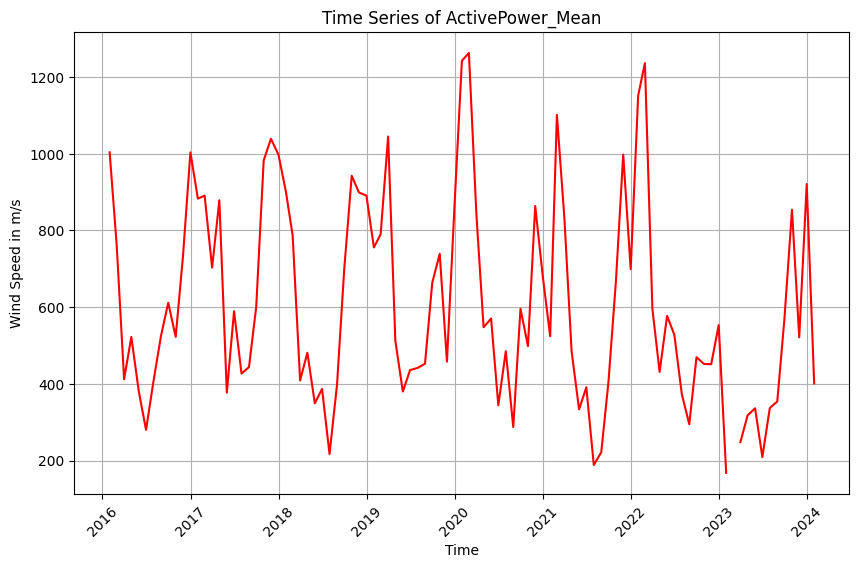

In [ ]:
# time series with ActivePower monthly
#df.set_index('TimeStamp', inplace=True)
plt.figure(figsize=(10, 6))
plt.plot(df_monthly.index, df_monthly['ActivePower_Mean'], linestyle='-', color='r')
plt.title('Time Series of ActivePower_Mean')
plt.xlabel('Time')
plt.ylabel('Wind Speed in m/s')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

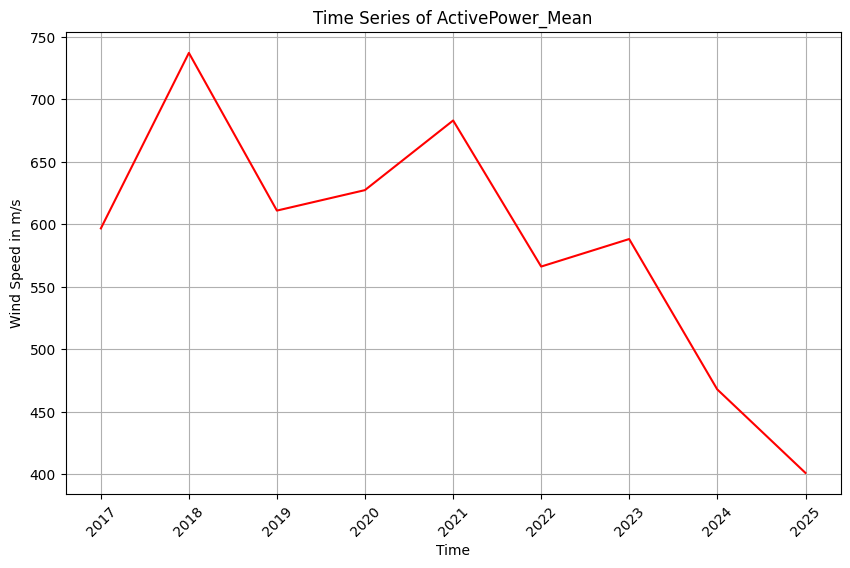

In [ ]:
# time series with ActivePower yearly
#df.set_index('TimeStamp', inplace=True)
plt.figure(figsize=(10, 6))
plt.plot(df_yearly.index, df_yearly['ActivePower_Mean'], linestyle='-', color='r')
plt.title('Time Series of ActivePower_Mean')
plt.xlabel('Time')
plt.ylabel('Wind Speed in m/s')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

#### Active Power vs other variables

##### Active Power Stand Alone

In [ ]:
#Active Power
fig = go.Figure()

# Add Active Power trace
fig.add_trace(go.Scatter(
    x=df_monthly.index,
    y=df_monthly["ActivePower_Mean"],
    mode='lines',
    name='Active Power',
    hovertemplate='Active Power: %{y:.2f} kW<br>Date: %{x}<extra></extra>'
))

# Layout options
fig.update_layout(
    title="Active Power Monthly",
    xaxis_title="Time",
    yaxis_title="Units ",
    hovermode="x unified",
    template="plotly_white"
)

#could add sanity check with formula P = root 3 * U * I

fig.show()

##### Active Power vs Power Factor vs Frequency

In [ ]:
#Active Power vsPower Factor and Frequency
fig = go.Figure()

# Add Active Power trace
fig.add_trace(go.Scatter(
    x=df_monthly.index,
    y=df_monthly["ActivePower_Mean"],
    mode='lines',
    name='Active Power',
    hovertemplate='Active Power: %{y:.2f} kW<br>Date: %{x}<extra></extra>'
))

# Add Frequency trace - Scaled by 10
fig.add_trace(go.Scatter(
    x=df_monthly.index,
    y=df_monthly["Frequency_Mean"]*10,
    mode='lines',
    name='Frequency - Scaled by 10',
    hovertemplate='Frequency: %{y:.2f} Hz*10<br>Date: %{x}<extra></extra>'
))

# Add PowerFactor - Scaled by 1000 trace
fig.add_trace(go.Scatter(
    x=df_monthly.index,
    y=df_monthly["PowerFactor_Mean"]*1000,
    mode='lines',
    name='Power Factor - Scaled by 1000',
    hovertemplate='Power Factor: %{y:.2f} Cos Phi*1000 <br>Date: %{x}<extra></extra>'
))
# Layout options
fig.update_layout(
    title="Active Power vs Power Factor vs Frequency (Weekly)",
    xaxis_title="Time",
    yaxis_title="Units ",
    hovermode="x unified",
    template="plotly_white"
)
fig.show()


##### Active Power vs Wind Speed

In [ ]:
#Active Power vs Wind Speed
fig = go.Figure()

# Add Active Power trace
fig.add_trace(go.Scatter(
    x=df_monthly.index,
    y=df_monthly["ActivePower_Mean"],
    mode='lines',
    name='Active Power',
    hovertemplate='Active Power: %{y:.2f} kW<br>Date: %{x}<extra></extra>'
))

# Add Wind Speed trace - Scaled by 100
fig.add_trace(go.Scatter(
    x=df_monthly.index,
    y=df_monthly["WindSpeed_Mean"]*100,
    mode='lines',
    name='Wind Speed - Scaled by 100',
    hovertemplate='Wind Speed: %{y:.2f} mm/s<br>Date: %{x}<extra></extra>'
))

# Layout options
fig.update_layout(
    title="Active Power vs Wind Speed (Weekly)",
    xaxis_title="Time",
    yaxis_title="Wind Speed in mm/s and Power in kW ",
    hovermode="x unified",
    template="plotly_white"
)

fig.show()

##### Active Power vs Volt vs Current Electricity

In [ ]:
#Active Power vs Volt vs Current Electricity
fig = go.Figure()

# Add Active Power trace
fig.add_trace(go.Scatter(
    x=df_monthly.index,
    y=df_monthly["ActivePower_Mean"],
    mode='lines',
    name='Active Power',
    hovertemplate='Active Power: %{y:.2f} kW<br>Date: %{x}<extra></extra>'
))


# Add Volt L1 trace
fig.add_trace(go.Scatter(
    x=df_monthly.index,
    y=(df_monthly["VoltL1_Mean"]+df_monthly["VoltL2_Mean"]+df_monthly["VoltL3_Mean"])/3,
    mode='lines',
    name='Volt Phases Mean',
    hovertemplate='Volt Phases Mean: %{y:.2f} V<br>Date: %{x}<extra></extra>'
))

# Add Energy L1 trace
fig.add_trace(go.Scatter(
    x=df_monthly.index,
    y=(df_monthly["CurrentL1_Mean"]+df_monthly["CurrentL2_Mean"]+df_monthly["CurrentL3_Mean"])/3,
    mode='lines',
    name='Energy/Current Phases Mean',
    hovertemplate='Energy Phases Mean: %{y:.2f} A<br>Date: %{x}<extra></extra>'
))

# Layout options
fig.update_layout(
    title="Active Power vs Volt vs Energy (Weekly)",
    xaxis_title="Time",
    yaxis_title="Units",
    hovermode="x unified",
    template="plotly_white"
)
fig.show()


#### Correlation Matrix

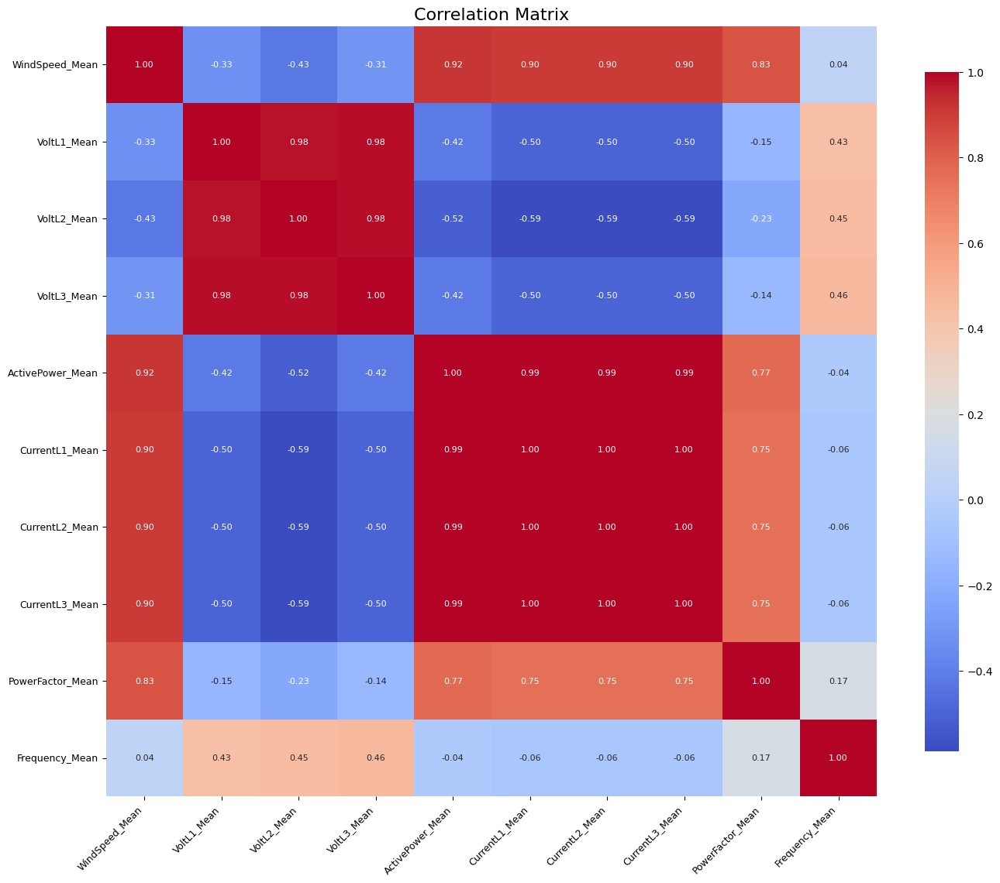

In [ ]:
# Monthly data
# Calculate correlation matrix
corr_matrix = df_monthly.corr()

# Plot the heatmap
plt.figure(figsize=(14, 12))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm',
            square=True, cbar_kws={"shrink": 0.8},
            annot_kws={"size": 8})
plt.title("Correlation Matrix", fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=9)
plt.yticks(fontsize=9)
plt.tight_layout()
plt.show()


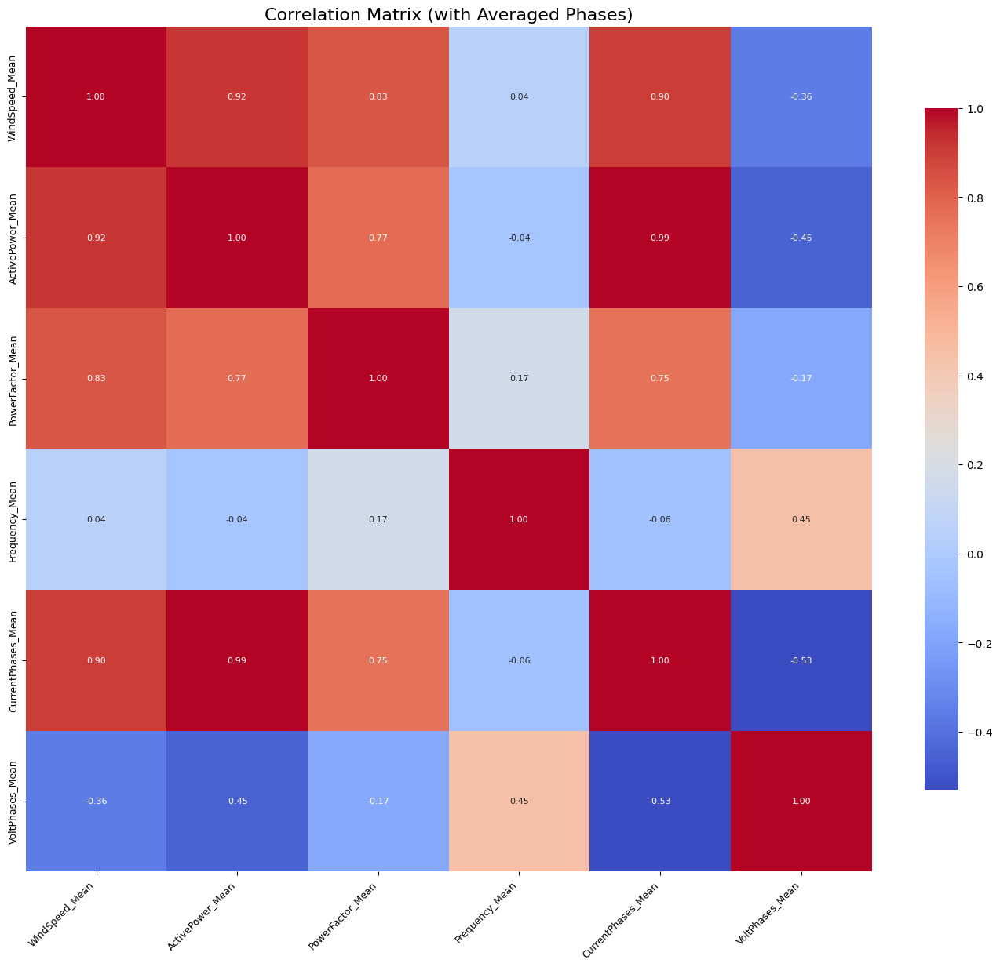

In [ ]:
# Second Correlation Matrix with averaged Current Energy and Volt Phases
# Create a copy of dataset
df_corr = df_monthly.copy()

# Create new averaged variables
df_corr['CurrentPhases_Mean'] = (df_corr['CurrentL1_Mean'] + df_corr['CurrentL2_Mean'] + df_corr['CurrentL3_Mean']) / 3
df_corr['VoltPhases_Mean'] = (df_corr['VoltL1_Mean'] + df_corr['VoltL2_Mean'] + df_corr['VoltL3_Mean']) / 3

# Drop the original L1, L2, L3 columns
df_corr = df_corr.drop(columns=[
    'CurrentL1_Mean', 'CurrentL2_Mean', 'CurrentL3_Mean',
    'VoltL1_Mean', 'VoltL2_Mean', 'VoltL3_Mean'
])

# Calculate the correlation matrix
corr_matrix = df_corr.corr()

# Plot the heatmap
plt.figure(figsize=(14, 12))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm',
            square=True, cbar_kws={"shrink": 0.8},
            annot_kws={"size": 8})
plt.title("Correlation Matrix (with Averaged Phases)", fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=9)
plt.yticks(fontsize=9)
plt.tight_layout()
plt.show()

### Outlier Detection
Checking potential outliers.

#### Univariate Outlier Detection

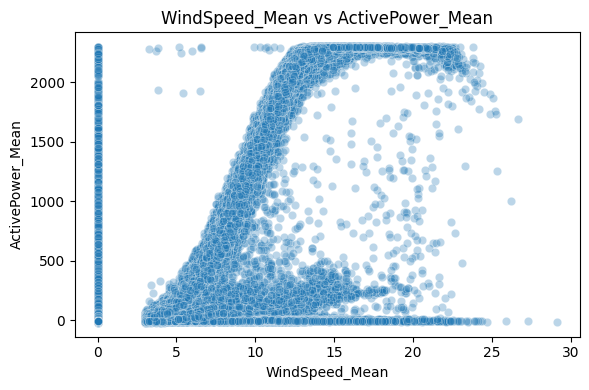

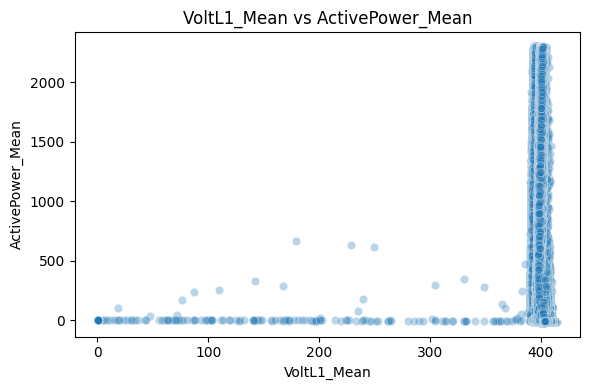

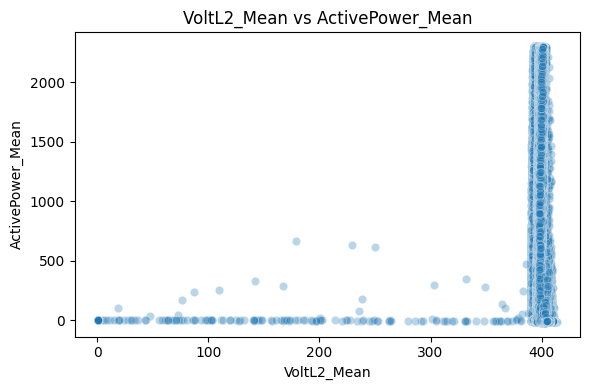

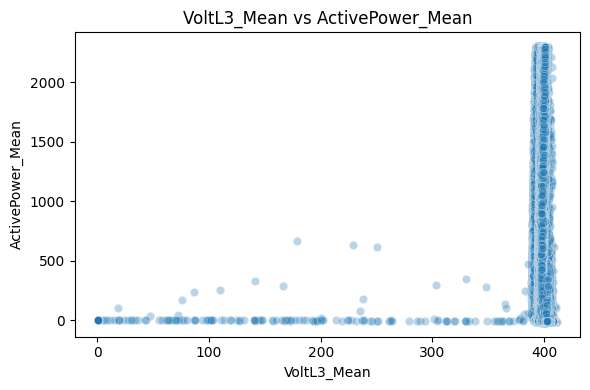

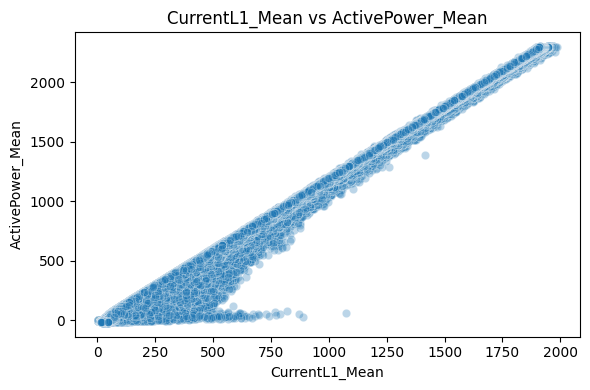

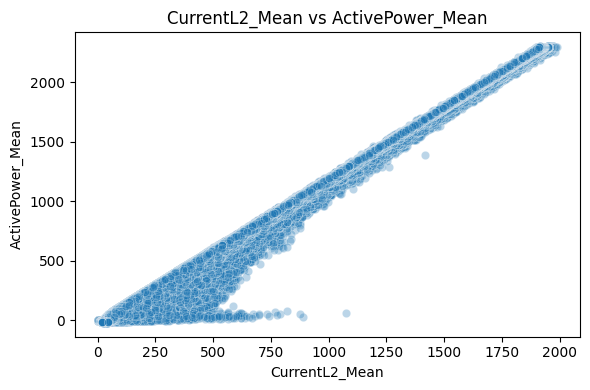

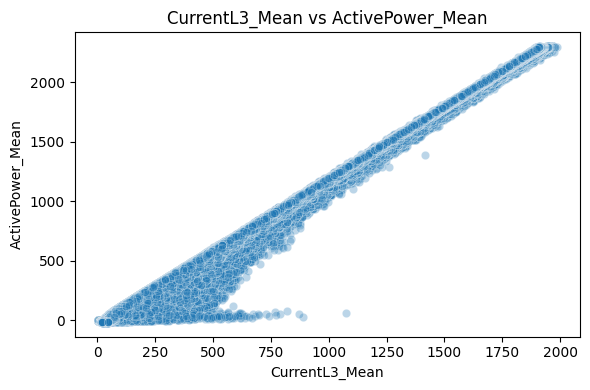

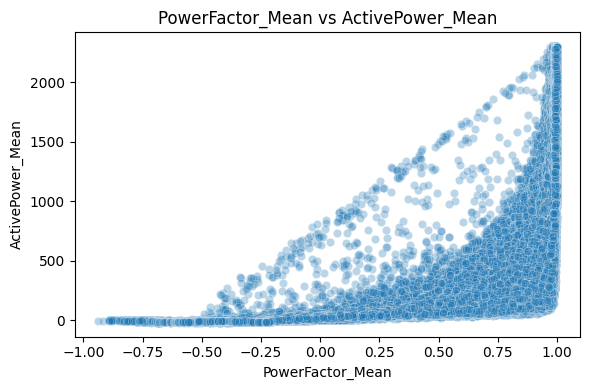

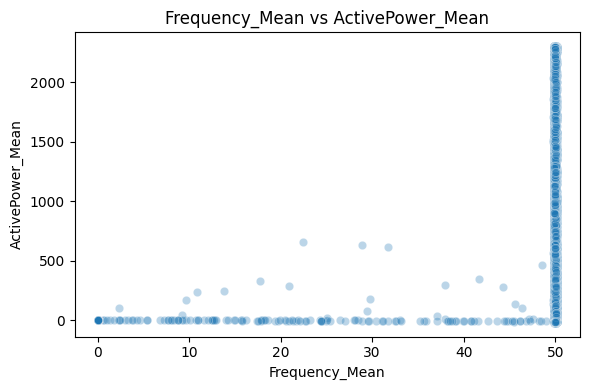

In [ ]:
# scatterplots: all variables vs. ActivePower_Mean
target = 'ActivePower_Mean'
exclude = ['Unnamed: 0', target]

features = [col for col in df_wind.columns
            if col not in exclude and df_wind[col].dtype in ['float64', 'int64']]

for feature in features:
    plt.figure(figsize=(6, 4))
    sns.scatterplot(data=df_wind, x=feature, y=target, alpha=0.3)
    plt.title(f'{feature} vs {target}')
    plt.xlabel(feature)
    plt.ylabel(target)
    plt.tight_layout()
    plt.show()

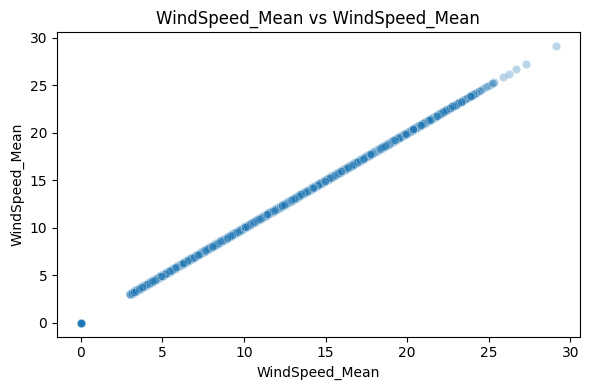

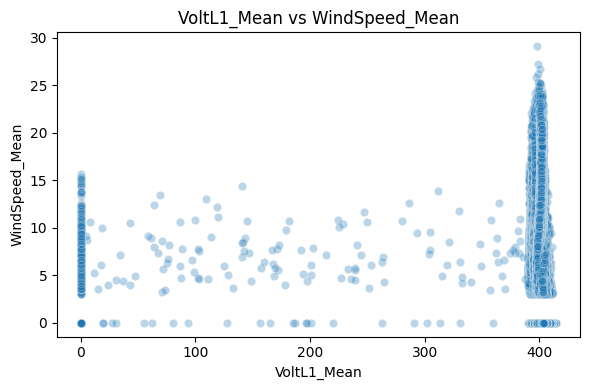

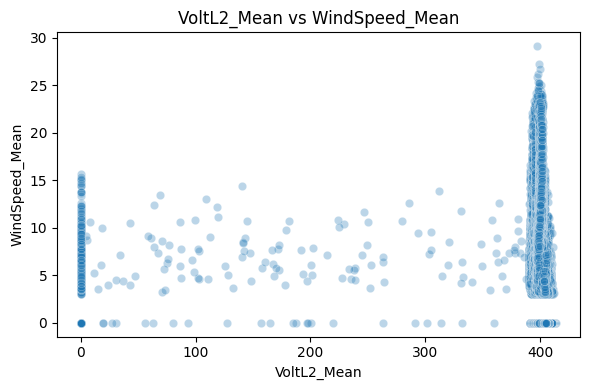

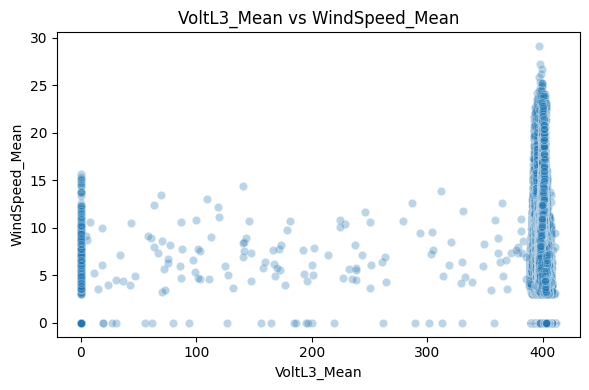

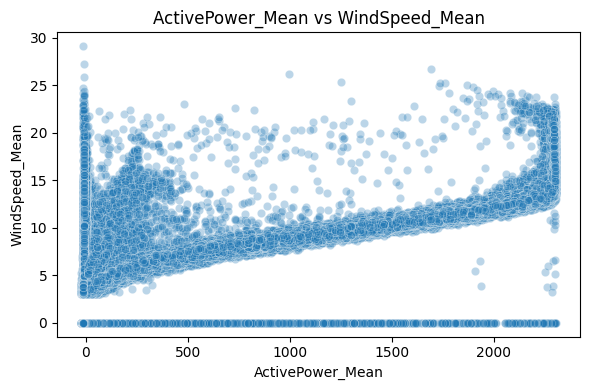

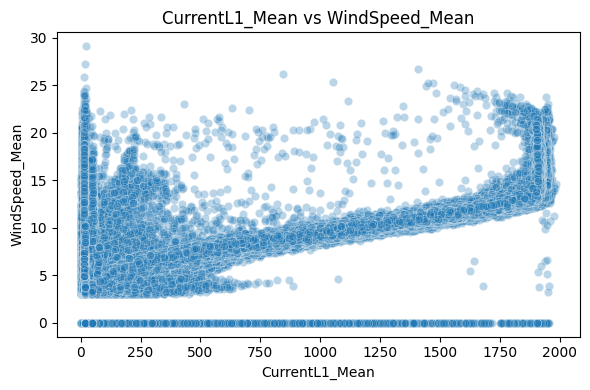

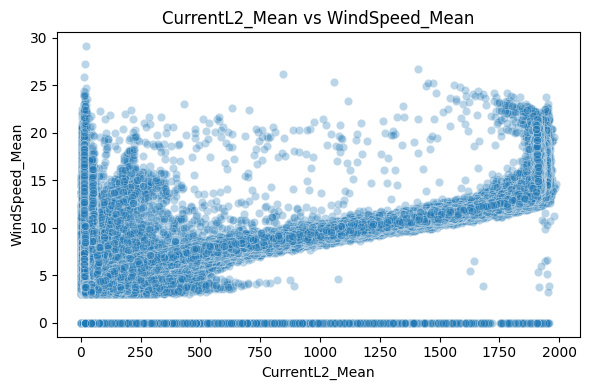

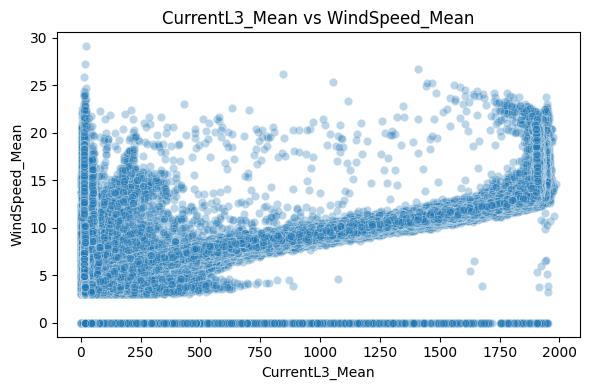

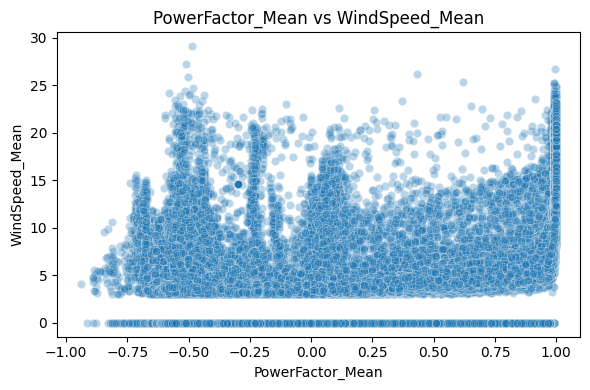

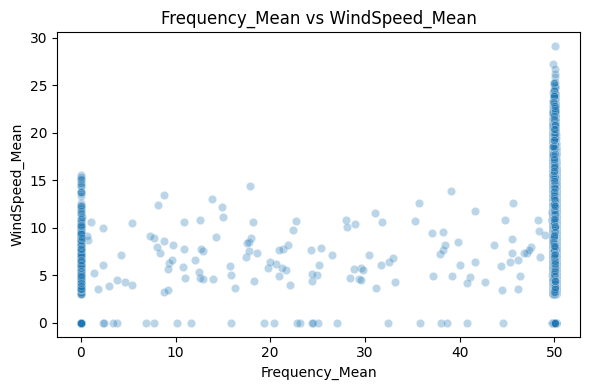

In [ ]:
# scatterplots: all variables vs. ActivePower_Mean
target = 'WindSpeed_Mean'

features = [col for col in df_wind.columns]

for feature in features:
    plt.figure(figsize=(6, 4))
    sns.scatterplot(data=df_wind, x=feature, y=target, alpha=0.3)
    plt.title(f'{feature} vs {target}')
    plt.xlabel(feature)
    plt.ylabel(target)
    plt.tight_layout()
    plt.show()

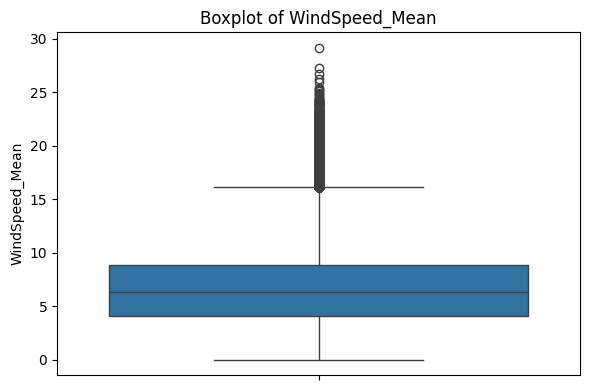

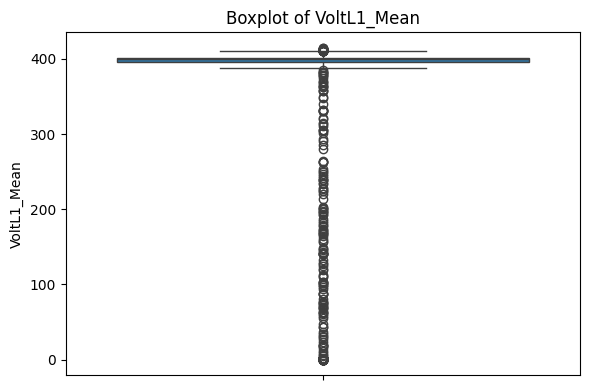

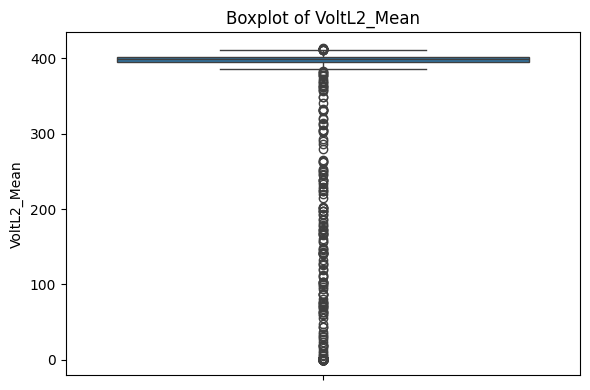

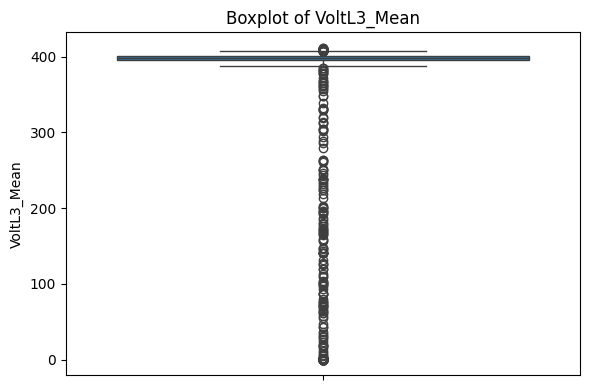

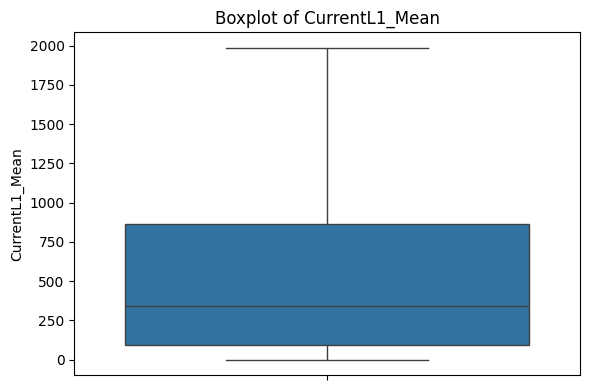

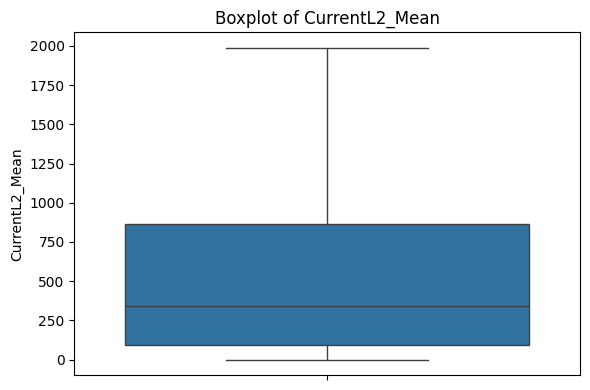

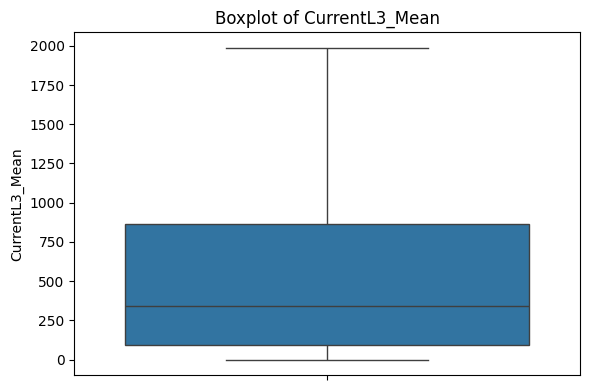

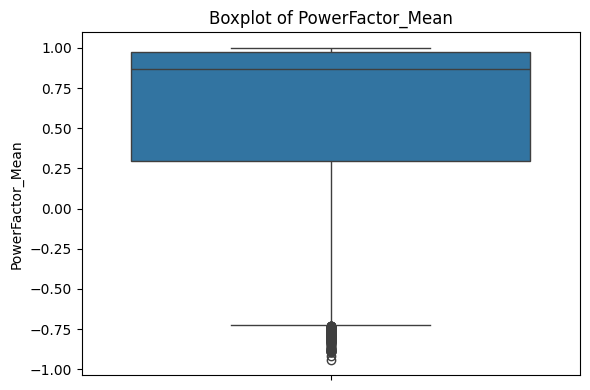

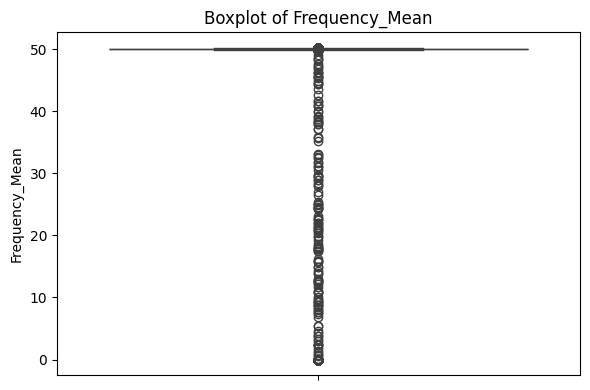

In [ ]:

# Define excluded columns
target = 'ActivePower_Mean'
exclude = ['Unnamed: 0', target]

# Select relevant numeric features
features = [col for col in df_wind.columns
            if col not in exclude and df_wind[col].dtype in ['float64', 'int64']]

# Plot boxplots for each feature
for feature in features:
    plt.figure(figsize=(6, 4))
    sns.boxplot(data=df_wind, y=feature)
    plt.title(f'Boxplot of {feature}')
    plt.tight_layout()
    plt.show()

### Power Curve Plotting

<ipython-input-47-73481790ce15>:23: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



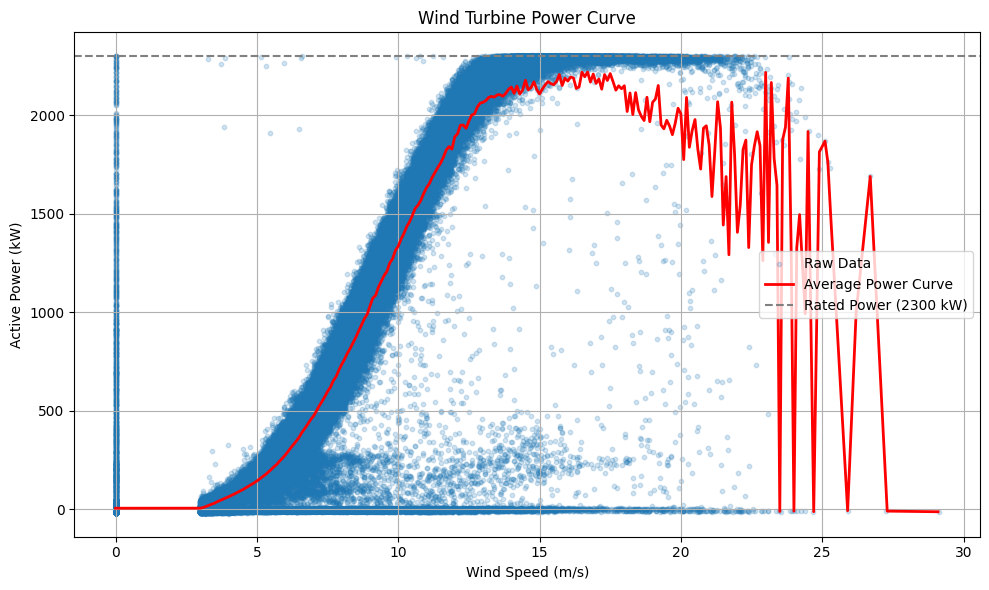

In [ ]:
#Power Curve Active Power vs Wind Speed

# Bin wind speeds to smooth the curve
df_wind['WindSpeed_Bin'] = df_wind['WindSpeed_Mean'].round(1)

# Calculate average power per wind speed bin
power_curve = df_wind.groupby('WindSpeed_Bin')['ActivePower_Mean'].mean().reset_index()

# Plot Power Curve
plt.figure(figsize=(10, 6))
plt.scatter(df_wind['WindSpeed_Mean'], df_wind['ActivePower_Mean'], alpha=0.2, label='Raw Data', s=10)
plt.plot(power_curve['WindSpeed_Bin'], power_curve['ActivePower_Mean'], color='red', label='Average Power Curve', linewidth=2)

# Turbine Max Power Rating
plt.axhline(2300, color='gray', linestyle='--', label='Rated Power (2300 kW)')


plt.title('Wind Turbine Power Curve')
plt.xlabel('Wind Speed (m/s)')
plt.ylabel('Active Power (kW)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

<ipython-input-48-67bab090e6d6>:15: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



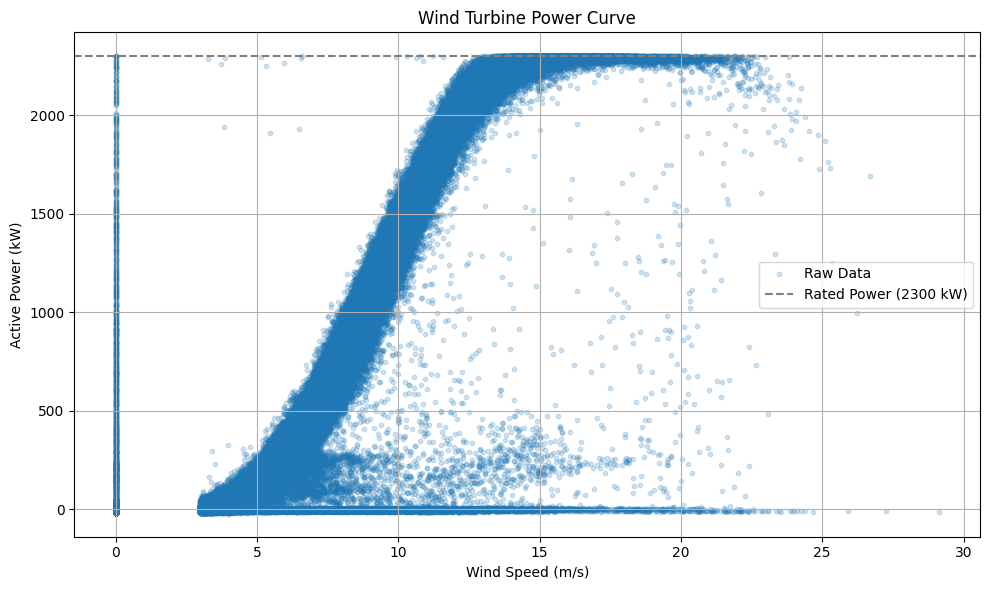

In [ ]:

# Plot Power Curve
plt.figure(figsize=(10, 6))
plt.scatter(df_wind['WindSpeed_Mean'], df_wind['ActivePower_Mean'], alpha=0.2, label='Raw Data', s=10)


# Turbine Max Power Rating
plt.axhline(2300, color='gray', linestyle='--', label='Rated Power (2300 kW)')


plt.title('Wind Turbine Power Curve')
plt.xlabel('Wind Speed (m/s)')
plt.ylabel('Active Power (kW)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

#### Outlier Detection: Current

Current L1, L2, L3

Phase: CurrentL1_Mean


<ipython-input-49-87682fbfc1bb>:65: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



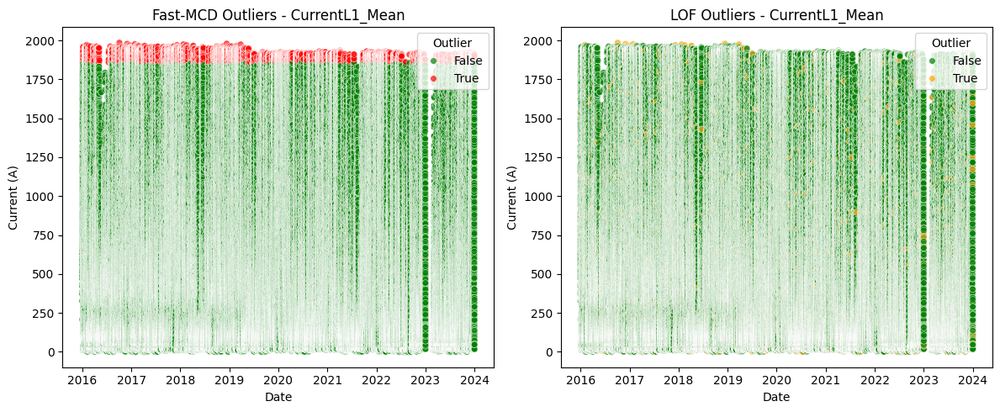

CurrentL1_Mean - Fast-MCD Outliers: 20005
CurrentL1_Mean - LOF Outliers: 20357
--------------------------------------------------
Phase: CurrentL2_Mean


<ipython-input-49-87682fbfc1bb>:65: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



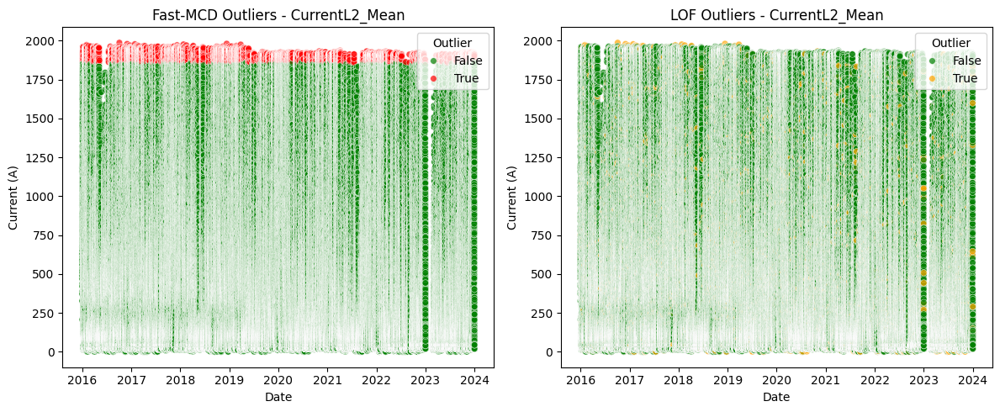

CurrentL2_Mean - Fast-MCD Outliers: 20008
CurrentL2_Mean - LOF Outliers: 20357
--------------------------------------------------
Phase: CurrentL3_Mean


<ipython-input-49-87682fbfc1bb>:65: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



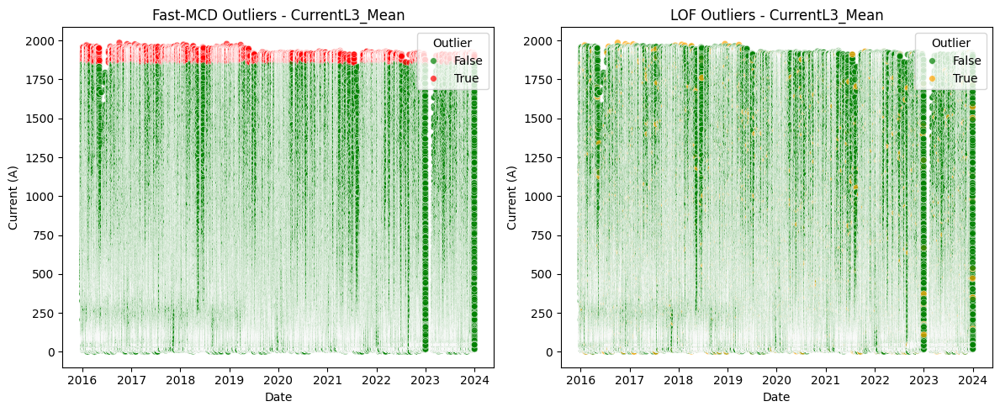

CurrentL3_Mean - Fast-MCD Outliers: 19976
CurrentL3_Mean - LOF Outliers: 20357
--------------------------------------------------


In [ ]:

from sklearn.covariance import MinCovDet
from sklearn.neighbors import LocalOutlierFactor
from scipy.spatial import distance
from scipy.stats import chi2
import matplotlib.pyplot as plt
import seaborn as sns

phases = ['CurrentL1_Mean', 'CurrentL2_Mean', 'CurrentL3_Mean']

# Loop through each phase
for phase in phases:
    print(f"Phase: {phase}")

    # Prepare data
    X_phase = df_wind[[phase]].dropna()

    ## --- Fast-MCD Outlier Detection ---
    mcd = MinCovDet(support_fraction=0.9, random_state=42)
    mcd.fit(X_phase)

    # Calculate Mahalanobis distances
    dists = [distance.mahalanobis(x, mcd.location_, np.linalg.inv(mcd.covariance_)) for x in X_phase.values]
    X_phase['MahalDist'] = dists

    # Set threshold
    threshold = np.sqrt(chi2.ppf(0.975, df=1))  # df=1 because 1D
    X_phase['FastMCD_Outlier'] = X_phase['MahalDist'] > threshold

    ## --- LOF Outlier Detection ---
    lof = LocalOutlierFactor(n_neighbors=20, contamination=0.05)
    lof_labels = lof.fit_predict(X_phase[[phase]])
    X_phase['LOF_Outlier'] = lof_labels == -1

    ## --- Plotting ---
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    sns.scatterplot(
        x=X_phase.index,
        y=X_phase[phase],
        hue=X_phase['FastMCD_Outlier'],
        palette={False: 'green', True: 'red'},
        s=30,
        alpha=0.7
    )
    plt.title(f'Fast-MCD Outliers - {phase}')
    plt.xlabel('Date')
    plt.ylabel('Current (A)')
    plt.legend(title='Outlier')

    plt.subplot(1, 2, 2)
    sns.scatterplot(
        x=X_phase.index,
        y=X_phase[phase],
        hue=X_phase['LOF_Outlier'],
        palette={False: 'green', True: 'orange'},
        s=30,
        alpha=0.7
    )
    plt.title(f'LOF Outliers - {phase}')
    plt.xlabel('Date')
    plt.ylabel('Current (A)')
    plt.legend(title='Outlier')

    plt.tight_layout()
    plt.show()

    ## --- Optional: Print counts ---
    fastmcd_count = X_phase['FastMCD_Outlier'].sum()
    lof_count = X_phase['LOF_Outlier'].sum()

    print(f"{phase} - Fast-MCD Outliers: {fastmcd_count}")
    print(f"{phase} - LOF Outliers: {lof_count}")
    print("-" * 50)




#### Outlier Detection Voltage

Voltage L1, L2, L3

Phase: VoltL1_Mean


<ipython-input-59-87b0ca5db133>:58: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



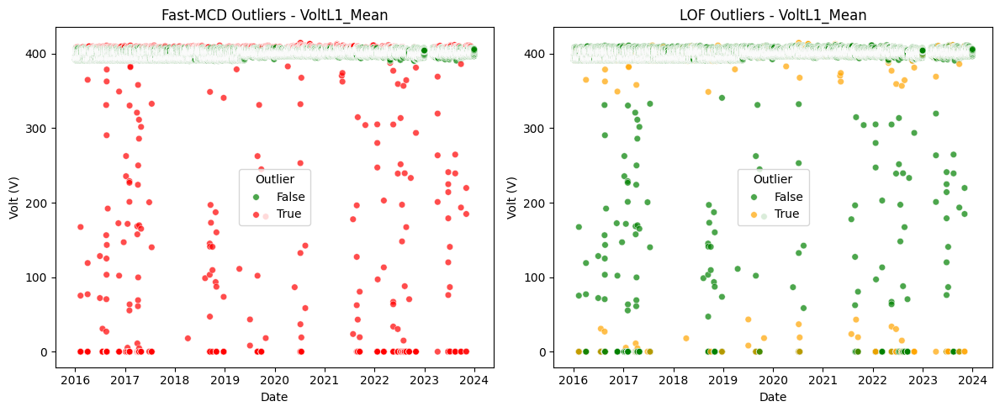

VoltL1_Mean - Fast-MCD Outliers: 2963
VoltL1_Mean - LOF Outliers: 20357
--------------------------------------------------
Phase: VoltL2_Mean


<ipython-input-59-87b0ca5db133>:58: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



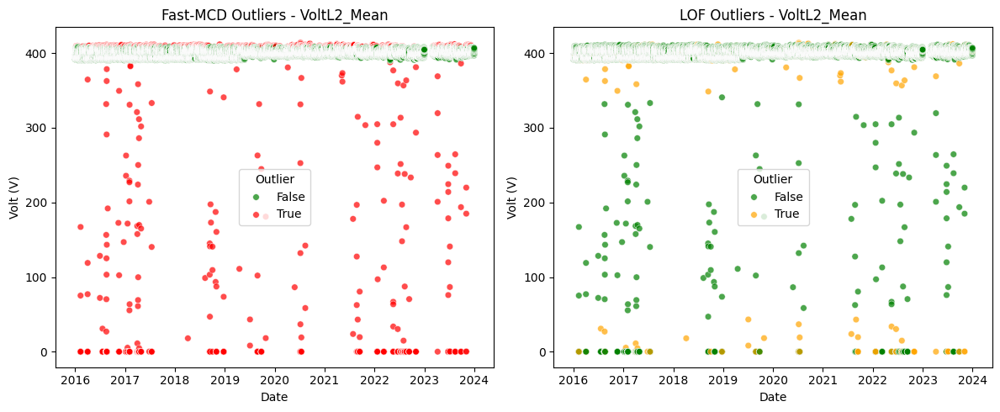

VoltL2_Mean - Fast-MCD Outliers: 4465
VoltL2_Mean - LOF Outliers: 20356
--------------------------------------------------
Phase: VoltL3_Mean


<ipython-input-59-87b0ca5db133>:58: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



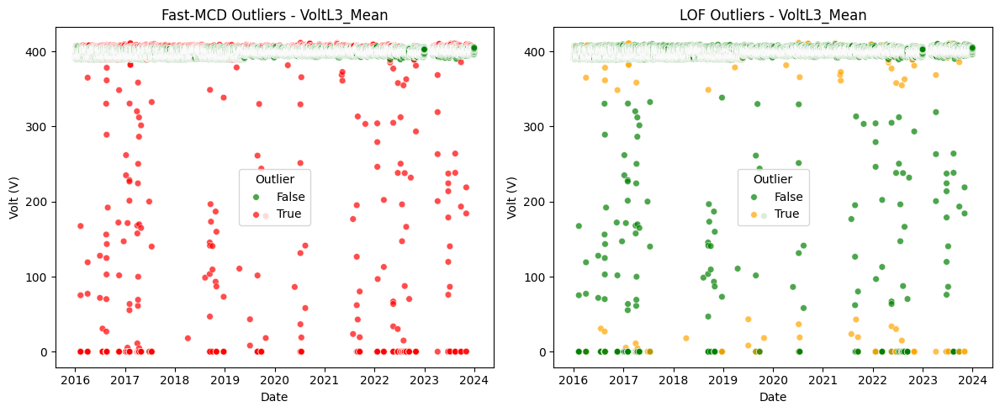

VoltL3_Mean - Fast-MCD Outliers: 4113
VoltL3_Mean - LOF Outliers: 20357
--------------------------------------------------


In [ ]:

phases = ['VoltL1_Mean', 'VoltL2_Mean', 'VoltL3_Mean']

# Loop through each phase
for phase in phases:
    print(f"Phase: {phase}")

    # Prepare data
    X_phase = df_wind[[phase]].dropna()

    ## --- Fast-MCD Outlier Detection ---
    mcd = MinCovDet(support_fraction=0.9, random_state=42)
    mcd.fit(X_phase)

    # Calculate Mahalanobis distances
    dists = [distance.mahalanobis(x, mcd.location_, np.linalg.inv(mcd.covariance_)) for x in X_phase.values]
    X_phase['MahalDist'] = dists

    # Set threshold
    threshold = np.sqrt(chi2.ppf(0.975, df=1))  # df=1 because 1D
    X_phase['FastMCD_Outlier'] = X_phase['MahalDist'] > threshold

    ## --- LOF Outlier Detection ---
    lof = LocalOutlierFactor(n_neighbors=20, contamination=0.05)
    lof_labels = lof.fit_predict(X_phase[[phase]])
    X_phase['LOF_Outlier'] = lof_labels == -1

    ## --- Plotting ---
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    sns.scatterplot(
        x=X_phase.index,
        y=X_phase[phase],
        hue=X_phase['FastMCD_Outlier'],
        palette={False: 'green', True: 'red'},
        s=30,
        alpha=0.7
    )
    plt.title(f'Fast-MCD Outliers - {phase}')
    plt.xlabel('Date')
    plt.ylabel('Volt (V)')
    plt.legend(title='Outlier')

    plt.subplot(1, 2, 2)
    sns.scatterplot(
        x=X_phase.index,
        y=X_phase[phase],
        hue=X_phase['LOF_Outlier'],
        palette={False: 'green', True: 'orange'},
        s=30,
        alpha=0.7
    )
    plt.title(f'LOF Outliers - {phase}')
    plt.xlabel('Date')
    plt.ylabel('Volt (V)')
    plt.legend(title='Outlier')

    plt.tight_layout()
    plt.show()

    ## --- Optional: Print counts ---
    fastmcd_count = X_phase['FastMCD_Outlier'].sum()
    lof_count = X_phase['LOF_Outlier'].sum()

    print(f"{phase} - Fast-MCD Outliers: {fastmcd_count}")
    print(f"{phase} - LOF Outliers: {lof_count}")
    print("-" * 50)

##### Active Power

/usr/local/lib/python3.11/dist-packages/sklearn/neighbors/_lof.py:322: UserWarning:

Duplicate values are leading to incorrect results. Increase the number of neighbors for more accurate results.

<ipython-input-51-4d663324f2af>:54: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



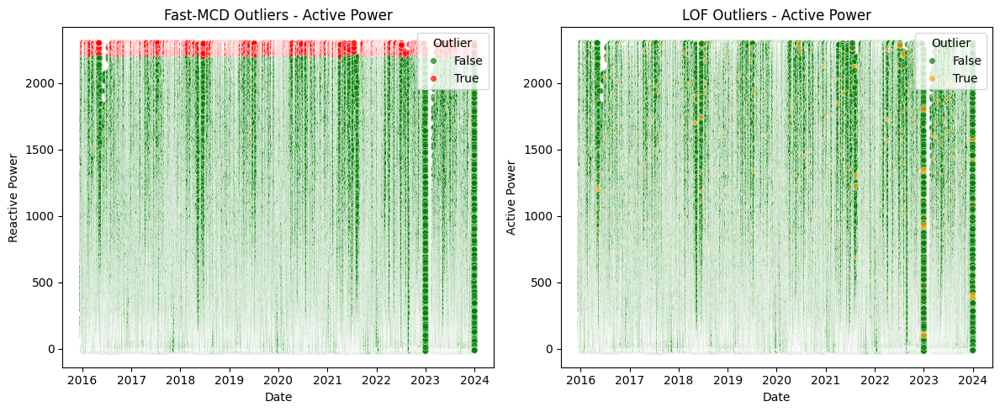

ActivePower_Mean - Fast-MCD Outliers: 20813
ActivePower_Mean - LOF Outliers: 20357
--------------------------------------------------


In [ ]:
# Prepare data for ActivePower_Mean
X_reactive = df_wind[['ActivePower_Mean']].copy()  # Create a copy to avoid SettingWithCopyWarning

# --- Fast-MCD Outlier Detection ---
mcd = MinCovDet(support_fraction=0.9, random_state=42)
mcd.fit(X_reactive)

# Calculate Mahalanobis distances
dists = [distance.mahalanobis(x, mcd.location_, np.linalg.inv(mcd.covariance_)) for x in X_reactive.values]
X_reactive['MahalDist'] = dists

# Set threshold (using Chi-squared distribution for 1D data)
threshold = np.sqrt(chi2.ppf(0.975, df=1))  # df=1 because 1D
X_reactive['FastMCD_Outlier'] = X_reactive['MahalDist'] > threshold

# --- LOF Outlier Detection ---
lof = LocalOutlierFactor(n_neighbors=20, contamination=0.05)
lof_labels = lof.fit_predict(X_reactive[['ActivePower_Mean']])
X_reactive['LOF_Outlier'] = lof_labels == -1

# --- Plotting ---
plt.figure(figsize=(12, 5))

# Fast-MCD Outliers
plt.subplot(1, 2, 1)
sns.scatterplot(
    x=X_reactive.index,
    y=X_reactive['ActivePower_Mean'],
    hue=X_reactive['FastMCD_Outlier'],
    palette={False: 'green', True: 'red'},
    s=30,
    alpha=0.7
)
plt.title('Fast-MCD Outliers - Active Power')
plt.xlabel('Date')
plt.ylabel('Reactive Power')
plt.legend(title='Outlier')

# LOF Outliers
plt.subplot(1, 2, 2)
sns.scatterplot(
    x=X_reactive.index,
    y=X_reactive['ActivePower_Mean'],
    hue=X_reactive['LOF_Outlier'],
    palette={False: 'green', True: 'orange'},
    s=30,
    alpha=0.7
)
plt.title('LOF Outliers - Active Power')
plt.xlabel('Date')
plt.ylabel('Active Power')
plt.legend(title='Outlier')

plt.tight_layout()
plt.show()

# --- Optional: Print counts ---
fastmcd_count = X_reactive['FastMCD_Outlier'].sum()
lof_count = X_reactive['LOF_Outlier'].sum()

print(f"ActivePower_Mean - Fast-MCD Outliers: {fastmcd_count}")
print(f"ActivePower_Mean - LOF Outliers: {lof_count}")
print("-" * 50)




#### Outlier Detection Frequency - Capping

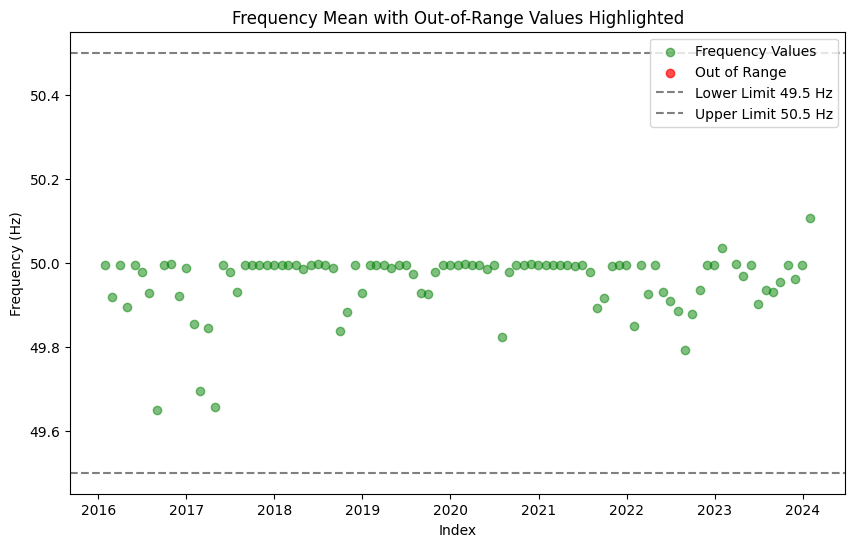

Number of rows with Frequency_Mean outside the range 49.5 - 50.5 Hz: 0
Total number of rows: 97
Percentage of rows with Frequency_Mean outside the range: 0.00%


In [ ]:
# Define the range for Frequency
lower_limit_freq = 49.5
upper_limit_freq = 50.5

# Filter out the rows where Frequency is out of range
out_of_range_freq = df_monthly[(df_monthly['Frequency_Mean'] < lower_limit_freq) | (df_monthly['Frequency_Mean'] > upper_limit_freq)]

# Plot the data
plt.figure(figsize=(10, 6))

# Plot all data points for Frequency_Mean
plt.scatter(df_monthly.index, df_monthly['Frequency_Mean'], label='Frequency Values', color='green', alpha=0.5)

# Highlight the out-of-range points
plt.scatter(out_of_range_freq.index, out_of_range_freq['Frequency_Mean'], label='Out of Range', color='red', alpha=0.7)

# Add labels and title
plt.axhline(y=lower_limit_freq, color='gray', linestyle='--', label=f'Lower Limit {lower_limit_freq} Hz')
plt.axhline(y=upper_limit_freq, color='gray', linestyle='--', label=f'Upper Limit {upper_limit_freq} Hz')
plt.xlabel('Index')
plt.ylabel('Frequency (Hz)')
plt.title('Frequency Mean with Out-of-Range Values Highlighted')
plt.legend()

# Show plot
plt.show()

# Calculate the number of out-of-range rows and the percentage
count_out_of_range_freq = out_of_range_freq.shape[0]
total_rows = df_monthly.shape[0]
percentage_out_of_range_freq = (count_out_of_range_freq / total_rows) * 100

# Print the result
print(f"Number of rows with Frequency_Mean outside the range {lower_limit_freq} - {upper_limit_freq} Hz: {count_out_of_range_freq}")
print(f"Total number of rows: {total_rows}")
print(f"Percentage of rows with Frequency_Mean outside the range: {percentage_out_of_range_freq:.2f}%")


#### Outlier Detection Wind Speed - Capping

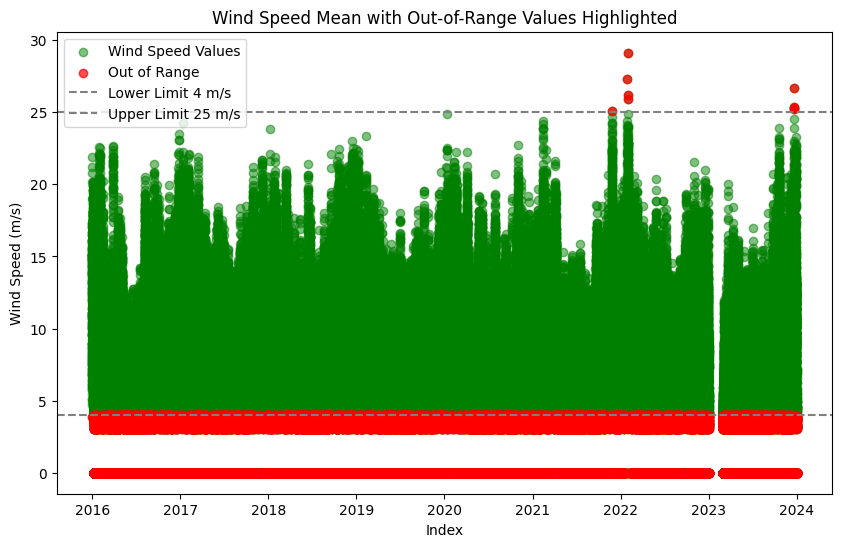

Number of rows with WindSpeed_Mean outside the range 4 - 25 m/s: 99437
Total number of rows: 407140
Percentage of rows with WindSpeed_Mean outside the range: 24.42%


In [ ]:
# Range
lower_limit_wind = 4
upper_limit_wind = 25

# Filter out the rows
out_of_range_wind = df_wind[(df_wind['WindSpeed_Mean'] < lower_limit_wind) | (df_wind['WindSpeed_Mean'] > upper_limit_wind)]

# Plot the data
plt.figure(figsize=(10, 6))

# Plot all data points for WindSpeed_Mean
plt.scatter(df_wind.index, df_wind['WindSpeed_Mean'], label='Wind Speed Values', color='green', alpha=0.5)

# Highlight the out-of-range points
plt.scatter(out_of_range_wind.index, out_of_range_wind['WindSpeed_Mean'], label='Out of Range', color='red', alpha=0.7)

# Add labels and title
plt.axhline(y=lower_limit_wind, color='gray', linestyle='--', label=f'Lower Limit {lower_limit_wind} m/s')
plt.axhline(y=upper_limit_wind, color='gray', linestyle='--', label=f'Upper Limit {upper_limit_wind} m/s')
plt.xlabel('Index')
plt.ylabel('Wind Speed (m/s)')
plt.title('Wind Speed Mean with Out-of-Range Values Highlighted')
plt.legend()

# Show plot
plt.show()

# Calculate the number of out-of-range rows and the percentage
count_out_of_range_wind = out_of_range_wind.shape[0]
total_rows = df_wind.shape[0]
percentage_out_of_range_wind = (count_out_of_range_wind / total_rows) * 100

# Print the result
print(f"Number of rows with WindSpeed_Mean outside the range {lower_limit_wind} - {upper_limit_wind} m/s: {count_out_of_range_wind}")
print(f"Total number of rows: {total_rows}")
print(f"Percentage of rows with WindSpeed_Mean outside the range: {percentage_out_of_range_wind:.2f}%")


#### Outlier Detection Power Factor

[Fast-MCD] Number of detected outliers: 167417


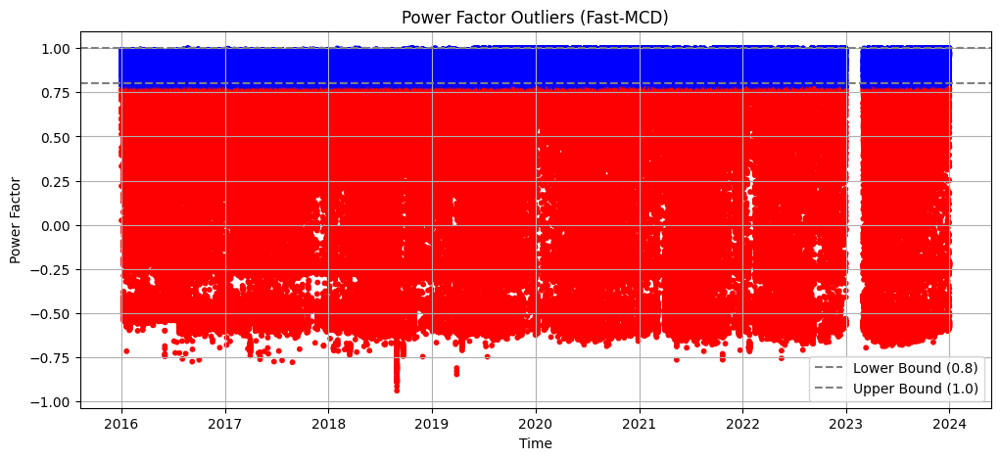

In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.covariance import MinCovDet

# Assume df_wind has PowerFactor_Mean and TimeStamp is already the index

# 1. Focus only on Power Factor
power_factor = df_wind[['PowerFactor_Mean']].dropna()

### FAST-MCD ###

# Initialize and fit Fast-MCD
mcd = MinCovDet(random_state=42)
mcd.fit(power_factor)

# Compute Mahalanobis distances
m_distances = mcd.mahalanobis(power_factor)

# Set threshold: roughly 97.5% quantile for chi-squared with 1 degree of freedom
threshold_mcd = 5.0  # loose threshold for 1D case
outliers_mcd = m_distances > threshold_mcd

# Count
print(f"[Fast-MCD] Number of detected outliers: {outliers_mcd.sum()}")

# Visualization
plt.figure(figsize=(12,5))
plt.scatter(power_factor.index, power_factor['PowerFactor_Mean'], c=np.where(outliers_mcd, 'red', 'blue'), s=10)
plt.axhline(0.8, color='gray', linestyle='--', label='Lower Bound (0.8)')
plt.axhline(1.0, color='gray', linestyle='--', label='Upper Bound (1.0)')
plt.title('Power Factor Outliers (Fast-MCD)')
plt.xlabel('Time')
plt.ylabel('Power Factor')
plt.legend()
plt.grid(True)
plt.show()


#### Hierarchical cutting of outliers (descending number of outliers)
1. Wind
2. Volt
3. Frequency

In [ ]:
df_wind.head()

,WindSpeed_Mean,VoltL1_Mean,VoltL2_Mean,VoltL3_Mean,ActivePower_Mean,CurrentL1_Mean,CurrentL2_Mean,CurrentL3_Mean,PowerFactor_Mean,Frequency_Mean,WindSpeed_Bin
TimeStamp,,,,,,,,,,,
2016-01-01 00:00:00,6.785655,392.817993,393.226410,392.404510,521.591797,588.076599,588.153687,588.288208,0.735540,50.030361,6.8
2016-01-01 00:10:00,6.085925,392.750610,393.095093,392.344208,352.522308,491.073486,491.226807,491.788910,0.564326,49.993130,6.1
2016-01-01 00:20:00,5.824687,393.093109,393.321503,392.433807,294.078888,472.158508,472.661804,472.771088,0.512421,49.952190,5.8
2016-01-01 00:30:00,7.100197,393.863586,394.046600,393.028595,587.302795,674.494019,674.627991,674.614319,0.705167,49.975941,7.1
2016-01-01 00:40:00,8.232280,394.487793,394.654785,393.713715,881.533325,866.352600,866.474121,865.911682,0.840677,49.930500,8.2


#### Replace Wind Speed < 3m/s with 0

In [ ]:
df_wind.loc[df_wind['WindSpeed_Mean'] < 3.0, 'WindSpeed_Mean'] = 0



In [ ]:
df_wind.dropna()

,WindSpeed_Mean,VoltL1_Mean,VoltL2_Mean,VoltL3_Mean,ActivePower_Mean,CurrentL1_Mean,CurrentL2_Mean,CurrentL3_Mean,PowerFactor_Mean,Frequency_Mean,WindSpeed_Bin
TimeStamp,,,,,,,,,,,
2016-01-01 00:00:00,6.785655,392.817993,393.226410,392.404510,521.591797,588.076599,588.153687,588.288208,0.735540,50.030361,6.8
2016-01-01 00:10:00,6.085925,392.750610,393.095093,392.344208,352.522308,491.073486,491.226807,491.788910,0.564326,49.993130,6.1
2016-01-01 00:20:00,5.824687,393.093109,393.321503,392.433807,294.078888,472.158508,472.661804,472.771088,0.512421,49.952190,5.8
2016-01-01 00:30:00,7.100197,393.863586,394.046600,393.028595,587.302795,674.494019,674.627991,674.614319,0.705167,49.975941,7.1
2016-01-01 00:40:00,8.232280,394.487793,394.654785,393.713715,881.533325,866.352600,866.474121,865.911682,0.840677,49.930500,8.2
...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 23:20:00,7.172434,403.628204,404.474487,402.623688,340.645386,288.370300,288.864594,290.687988,0.969194,49.971619,7.2
2023-12-31 23:30:00,7.122524,404.194489,405.046387,403.158203,344.137787,289.833710,290.224609,292.171997,0.972485,50.009689,7.1
2023-12-31 23:40:00,6.245202,404.420013,405.304291,403.379608,284.058197,241.515594,242.229904,244.120193,0.962043,50.047909,6.2


In [ ]:
#Export new resulting csv:
df_wind.reset_index()

df_wind.to_csv('df_wind_WS_adjusted_final.csv')


